# Method Comparison

This notebook will compare the two different methods I used to calculate strain rates


## Setup

In [1]:
# Load libraries
import sys
import sys
sys.path.append("../../xapres_package/")
import ApRESDefs
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker 

import xarray as xr
import importlib
import pandas as pd
import math
from datetime import datetime, timedelta, date
from scipy.stats import linregress


importlib.reload(ApRESDefs)
xa = ApRESDefs.xapres(loglevel='debug')

DEBUG    16:20:28 	 ApRESDefs.py @function _setup_logging line 615 - Stream logging level set to DEBUG
DEBUG    16:20:28 	 ApRESDefs.py @function _setup_logging line 616 - Add console handler to logger
DEBUG    16:20:28 	 ApRESDefs.py @function _setup_logging line 629 - File logging level set to DEBUG


In [2]:
# Load data
def reload(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        chunks={}) 
    return ds

ds_101 = reload("A101")
ds_103 = reload("A103_fixed")
ds_104 = reload("A104")

ds_101 = ds_101.isel(time=range(20,len(ds_101.time)))
ds_103 = ds_103.isel(time=range(60,len(ds_103.time)))
ds_104 = ds_104.isel(time=range(50,len(ds_104.time)))


def reload_winter(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}_winter22_23'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        consolidated=True, 
        chunks={}) 
    return ds

ds_101_w = reload_winter("A101")
ds_103_w = reload_winter("A103")
ds_104_w = reload_winter("A104")

def reload_summer(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}_summer_23'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        consolidated=True, 
        chunks={}) 
    return ds

ds_101_s = reload_summer("A101")
ds_103_s = reload_summer("A103")
ds_104_s = reload_summer("A104")

In [3]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:46069")
client

<Client: 'tcp://127.0.0.1:46069' processes=4 threads=16, memory=125.81 GiB>

In [4]:
# define function
def custom_stacked_profile_series(chirps,pad=2,F0=2e8,F1=4e8):
    StartFreq = 2e8
    StopFreq = 4e8
    B = StopFreq - StartFreq
    CentreFreq = B/2
    K = 2e8 
    dt = 1/40000
    c0 = 3e8 # speed of light in vaccuum
    ER_ICE = 3.18
    T0 = (F0-StartFreq)/K
    T1 = (F1-StartFreq)/K

    chirps = chirps.isel(chirp_time=range(math.ceil(T0/dt),math.floor(T1/dt)+1)).mean(dim='chirp_num')
    window = np.blackman(len(chirps.chirp_time))
    win_chirps = chirps*window
    Nt = len(chirps.chirp_time)
    Nfft = math.floor(Nt*pad)
    bin2m = c0/(2.*(T1-T0)*pad*math.sqrt(ER_ICE)*K)
    profile_range = np.asarray([i for i in range(Nfft)]) * bin2m      
    profile_range = profile_range[0:math.floor(Nfft/2)-1]
    padchirp = np.zeros((len(chirps.time),Nfft))
    padchirp[:,0:math.floor(Nt/2)] = win_chirps.data[:,math.floor(Nt/2):-1]
    padchirp[:,-math.floor(Nt/2):] = win_chirps.data[:,0:math.floor(Nt/2)]
    p = np.fft.fft(padchirp,axis=1)/Nfft * math.sqrt(2*pad)
    profile = p[:,0:math.floor(Nfft/2)-1]
    m = np.asarray([i for i in range(profile.shape[1])])/pad
    phiref = 2*math.pi*CentreFreq*m/B - m * m * 2*math.pi * K/2/B**2
    profile_ref = profile * np.exp(phiref[np.newaxis,:]*(-1j))
    profile_range = np.asarray([i for i in range(Nfft)]) * bin2m      
    profile_range = profile_range[0:math.floor(Nfft/2)-1]
    n = np.argmin(profile_range<=1400)
    Range = profile_range[:n]
    Profile = profile_ref[:,:n]
    da = xr.DataArray(Profile,
                  dims=['time','profile_range'],
                  coords={'profile_range': Range,
                         'time': chirps.time.data})
    return da

In [5]:
def generate_strain_fit(ds,window,lag,lims=None):
    # New method
    b1= ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_new = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')

    vv = ds_new.range_diff / ds_new.time_diff * 31536000
    vv_err = ds_new.err / ds_new.time_diff * 31536000
    fit=vv.where(vv.profile_range <=600).polyfit('profile_range',1,full=True)
    r2 = 1-fit.polyfit_residuals/((vv-vv.mean())**2).sum(dim='profile_range')
    
    # Old Method
    b1= ds.isel(time=range(0,len(ds)-1))
    b2 = ds.isel(time=range(1,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_old = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')
    vv_old = ds_old.range_diff.coarsen(time=lag,boundary='trim').sum()/ds_old.time_diff.coarsen(time=lag,boundary='trim').sum()*31536000
    vv_old_err = np.sqrt(((ds_old.err)**2).coarsen(time=lag,boundary='trim').sum())/ds_old.time_diff.coarsen(time=lag,boundary='trim').sum()*31536000
    fit_old=vv_old.where(vv_old.profile_range <=600).polyfit('profile_range',1,full=True)
    r2_old = 1-fit_old.polyfit_residuals/((vv_old-vv_old.mean())**2).sum(dim='profile_range')
    
    # Plotting
    fig, axs = plt.subplots(nrows=2,figsize=(10,6),sharex=True)
    axs[0].plot(fit.time.values,fit.polyfit_coefficients.sel(degree=1).values,linestyle='None',marker='.',label='leapfrog')
    axs[0].plot(fit_old.time.values,fit_old.polyfit_coefficients.sel(degree=1).values,label='summation')
    #axs[0].set_ylim([-1e-2,1e-2])
    axs[0].set_ylabel('Strain rate [y$^{-1}$]')
    axs[0].set_title('Strain fitting results')
    axs[0].legend(loc="upper left", ncol=2)

    axs[1].plot(fit.time.values,r2.values,linestyle='None',marker='.')
    axs[1].plot(fit_old.time.values,r2_old.values)
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('r$^2$')
    
    fig1, axs_1 = plt.subplots(ncols=10,figsize=(19,5),sharey=True,layout='constrained')
    #fig1.suptitle('Strain fitting (\u03B5\u0307 in 10$^{-3}$ yr$^{-1}$)',fontsize=18)
    vv_times = np.arange(math.ceil(0.05*len(vv_old.time)),len(vv_old.time),len(vv_old.time)//10)
    for i in range(10):
        time = vv_old.time.isel(time = vv_times[i]).values
        axs_1[i].errorbar(vv.sel(time = time,method="nearest") ,vv.profile_range,yerr=None,xerr=vv_err.sel(time = time,method="nearest"),marker='.',zorder=1)
        axs_1[i].errorbar(vv_old.sel(time = time,method="nearest") ,vv_old.profile_range,yerr=None,xerr=vv_old_err.sel(time = time,method="nearest"),linestyle='',marker='.',zorder=2)
        #slope = fit.polyfit_coefficients.sel(degree=1).isel(time=vv_times[i]).values*np.linspace(20,600)+fit.polyfit_coefficients.sel(degree=0).isel(time=vv_times[i]).values

        #axs_1[i].plot(slope,np.linspace(20,600),color='r',zorder=2)
        unit = ''#'x10$^{-3}$ yr$^{-1}$'
        #axs_1[plt_count].text(-10,300, f"\u03B5\u0307= {fit.polyfit_coefficients.sel(degree=1).isel(time=i).values*1000:.2g}"+unit,color = 'r',fontsize=14)
        axs_1[i].set_title(f'{time.astype(str)[:10]}')
        if lims:
            axs_1[i].set_xlim(lims)
        axs_1[i].set_ylim([20,1400])
        axs_1[i].tick_params(axis='both', which='major', labelsize=14)


    axs_1[0].invert_yaxis()

    axs_1[0].set_ylabel('depth [m]',fontsize=18)
    fig1.supxlabel('vertical velocity [m y$^{-1}$]',fontsize=18)
    return vv,vv_err,vv_old,vv_old_err

In [6]:
def plot_profile(to_plot,station,season):
    fig, ax = plt.subplots(figsize=(18,6))
    fg = xa.dB(to_plot).plot(ax=ax,x='time')
    fg.colorbar.ax.tick_params(labelsize=18)
    fg.colorbar.set_label(label='reflector amplitude [dB]', size=18)
    ax.invert_yaxis()
    ax.set_title(f"{season} englacial reflector amplitudes at {station}",fontsize=18)
    plt.xlabel('Date',fontsize=18)
    plt.ylabel('range [m]',fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=18)

In [7]:
def plot_error(vv,vv_err,vv_old,vv_old_err):
    fig, ax = plt.subplots(figsize=(10,5))

    plt.errorbar(vv.profile_range,vv_err.mean(dim='time'),yerr=vv_err.std(dim='time'),marker='s',color='k',linestyle='None',label='leapfrog error')
    plt.errorbar(vv_old.profile_range,vv_old_err.mean(dim='time'),yerr=vv_old_err.std(dim='time'),marker='s',color='r',linestyle='None',label='summation error')
    vv.std(dim='time').plot(marker='.',linestyle='None',label = 'leapfrog vv stdev')
    vv_old.std(dim='time').plot(marker='.',linestyle='None',label='summation vv stdev')

    ax.set_yscale('log')
    ax.legend(loc="upper left", ncol=4)



#fig,axs = plt.subplots(nrows=10,figsize=(10,15),sharex=True,layout='constrained')
#for i in range(10):
#    depth = vv.profile_range.isel(profile_range=i*4).values
#    vv_err.isel(profile_range=i*4).plot(ax=axs[i],marker='.',color='k')
#    axs[i].plot(vv.time.values,vv.isel(profile_range=i*4).std(dim='time').values*np.ones(vv.time.values.shape))
    

## A11

### Summer 2022

In [8]:
to_plot = custom_stacked_profile_series(ds_101.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


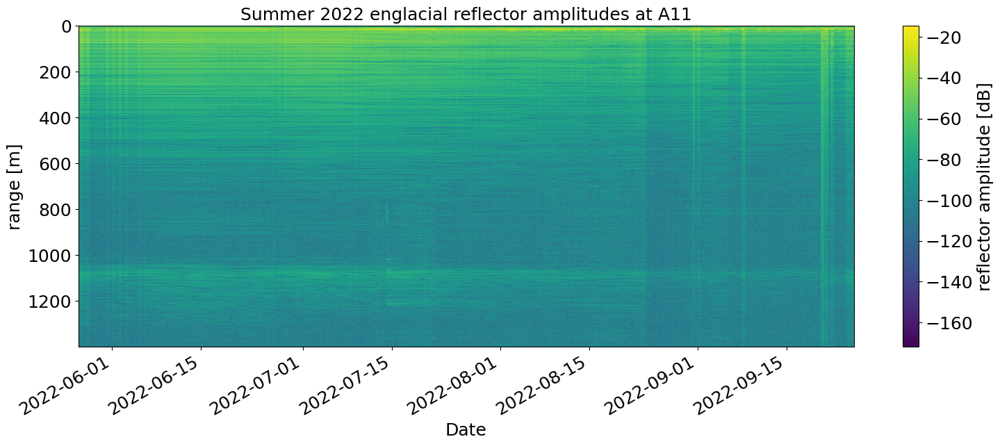

In [9]:
plot_profile(to_plot,'A11','Summer 2022')

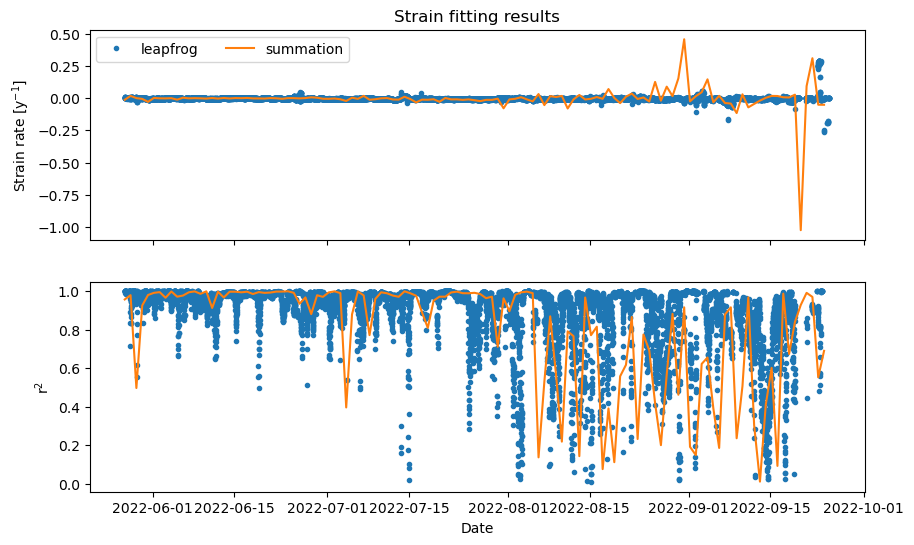

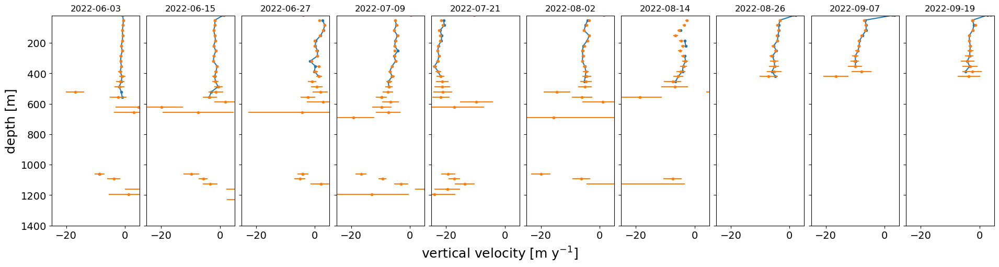

In [10]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,96,[-25,5])

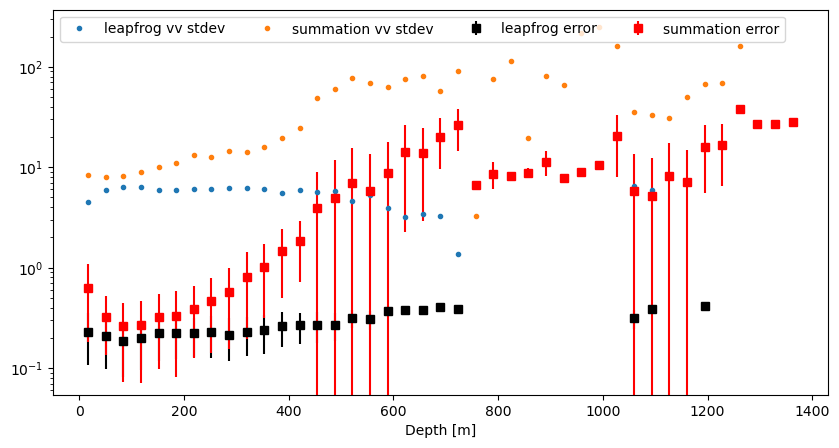

In [11]:
plot_error(vv,vv_err,vv_old,vv_old_err)

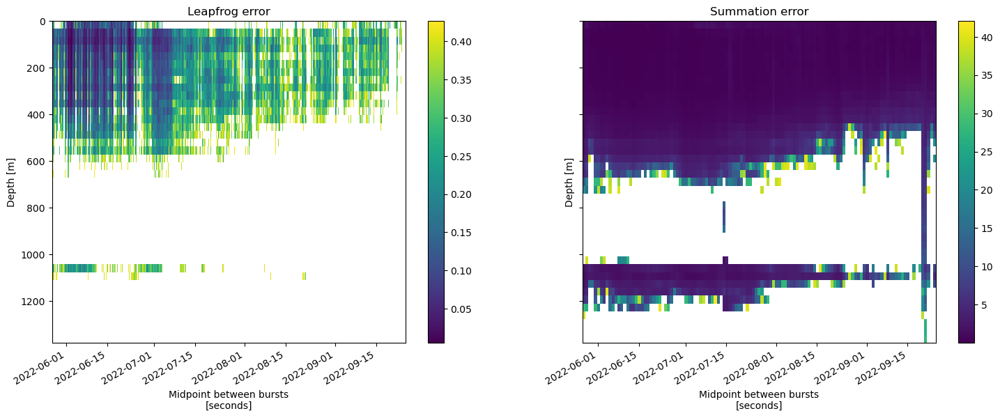

In [15]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Winter 2022-2023

In [16]:
to_plot = ds_101_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


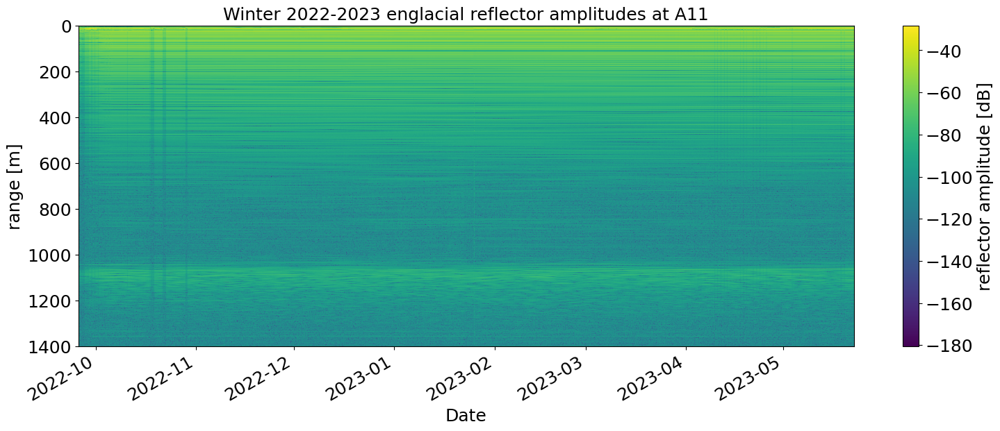

In [17]:
plot_profile(to_plot,'A11','Winter 2022-2023')

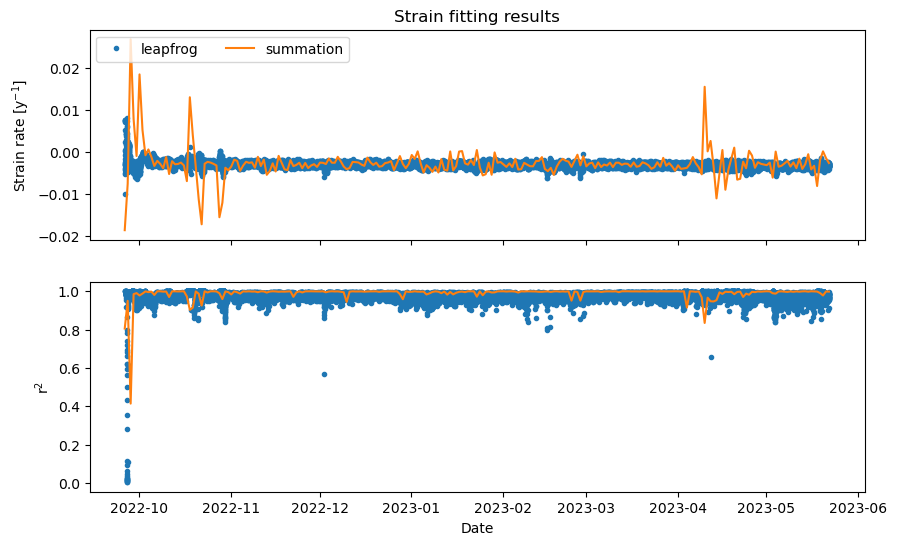

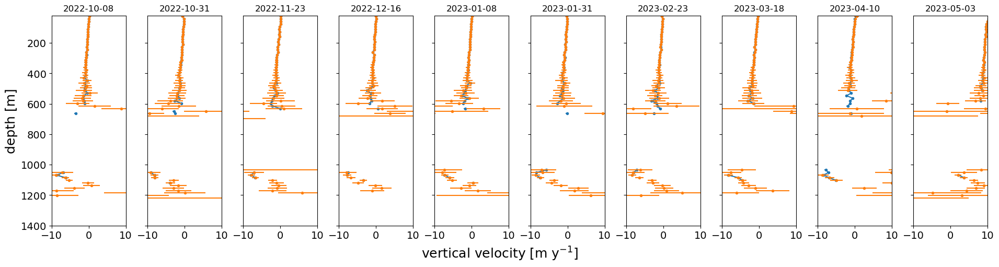

In [18]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,96,[-10,10])

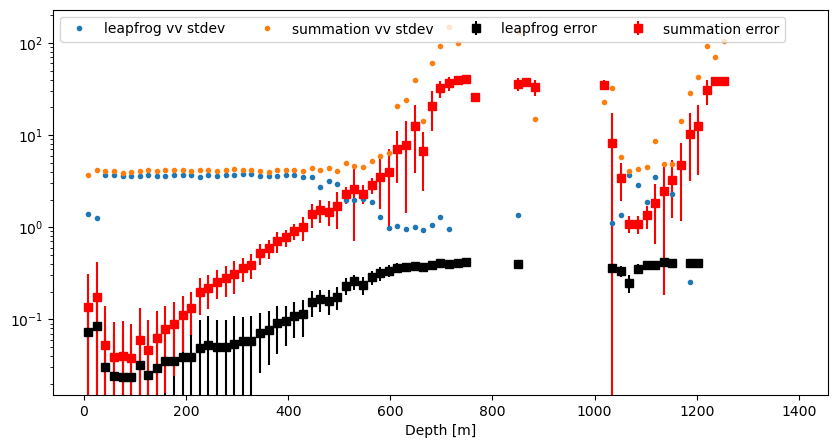

In [19]:
plot_error(vv,vv_err,vv_old,vv_old_err)

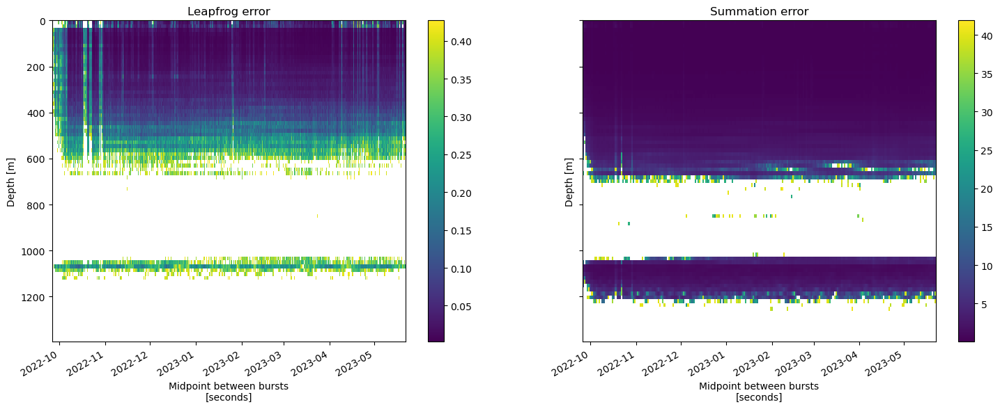

In [20]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### No Summer 2023 data

## Station A13

### Summer 2022

In [21]:
to_plot  = custom_stacked_profile_series(ds_103.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


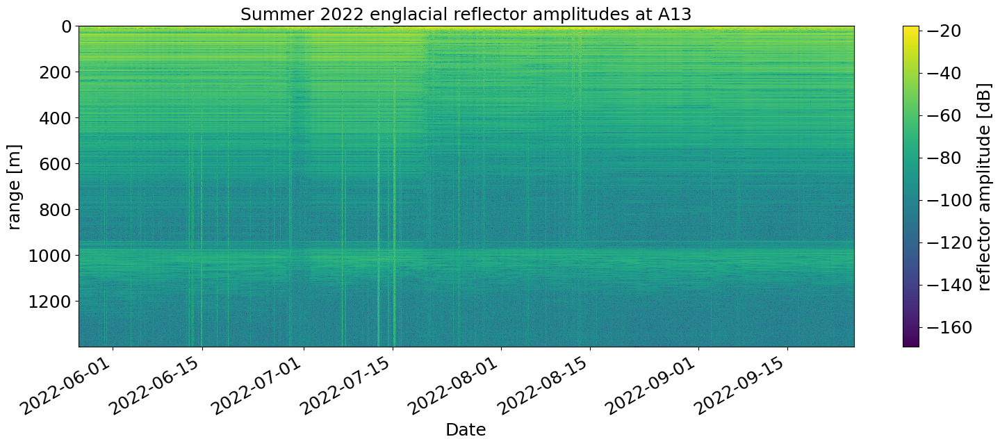

In [22]:
plot_profile(to_plot,'A13','Summer 2022')

/srv/conda/envs/notebook/lib/python3.10/site-packages/matplotlib/axes/_axes.py:1103: RuntimeWarning: All-NaN axis encountered
  minx = np.nanmin(masked_verts[..., 0])
/srv/conda/envs/notebook/lib/python3.10/site-packages/matplotlib/axes/_axes.py:1104: RuntimeWarning: All-NaN axis encountered
  maxx = np.nanmax(masked_verts[..., 0])


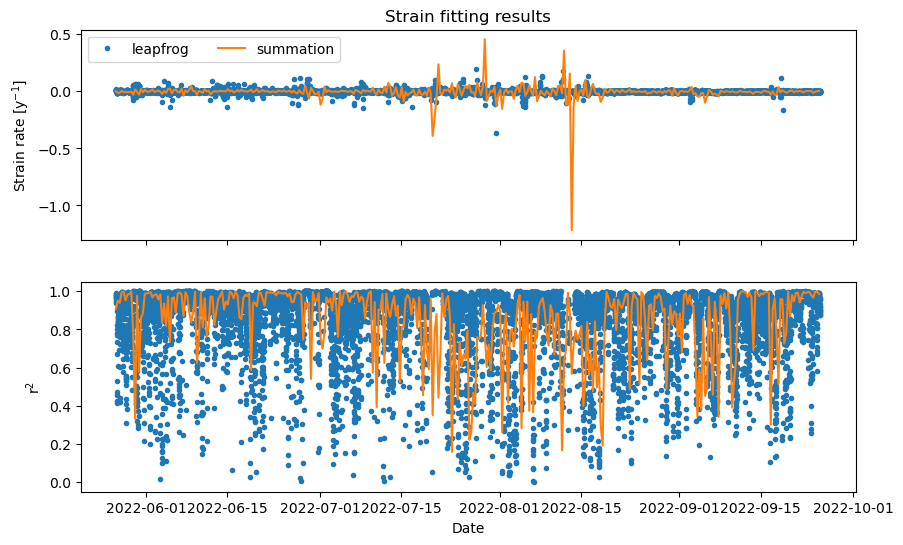

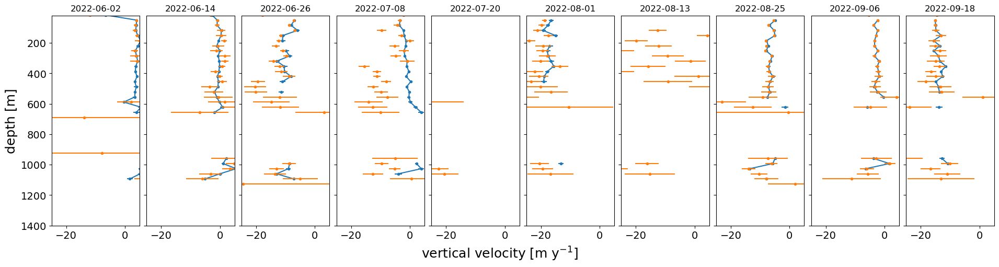

In [23]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,32,[-25,5]) # 8 hour window

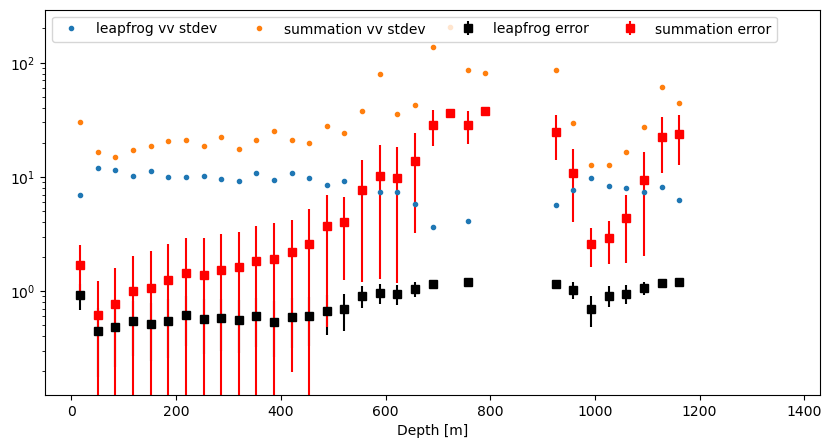

In [24]:
plot_error(vv,vv_err,vv_old,vv_old_err)

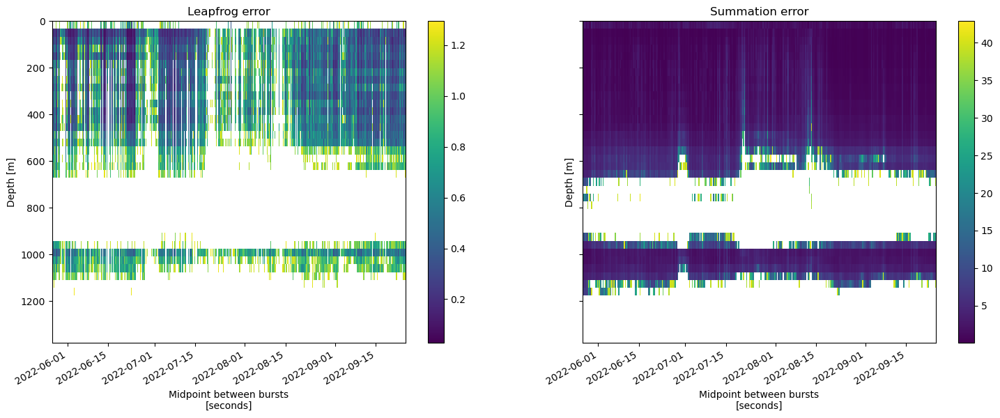

In [25]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Winter 2022-2023

In [26]:
to_plot = ds_103_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


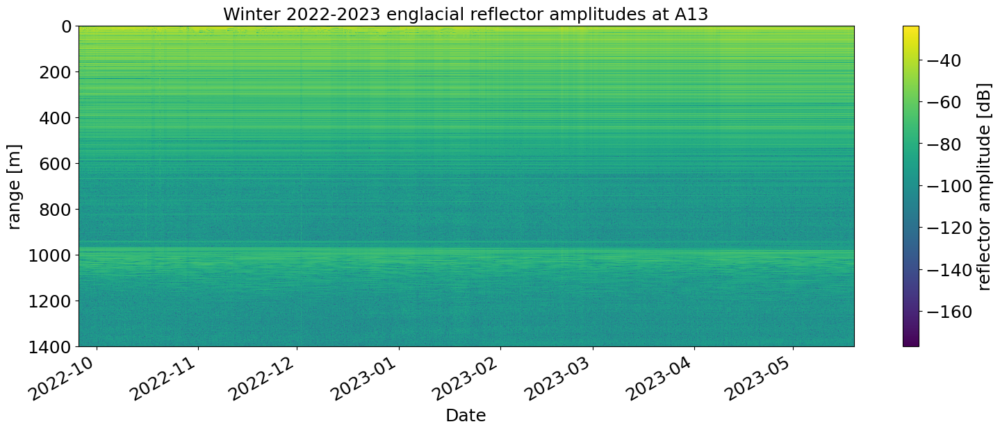

In [27]:
plot_profile(to_plot,'A13','Winter 2022-2023')

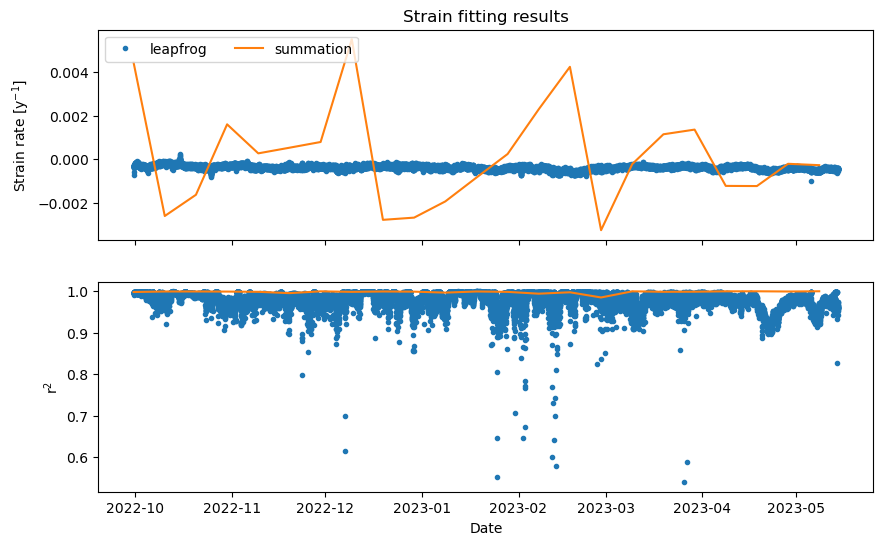

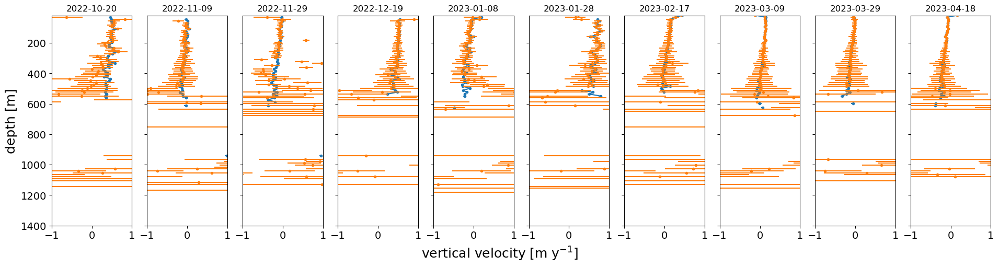

In [28]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,60,960,[-1,1]) # Best settings were 60, 1000 - 10 day window

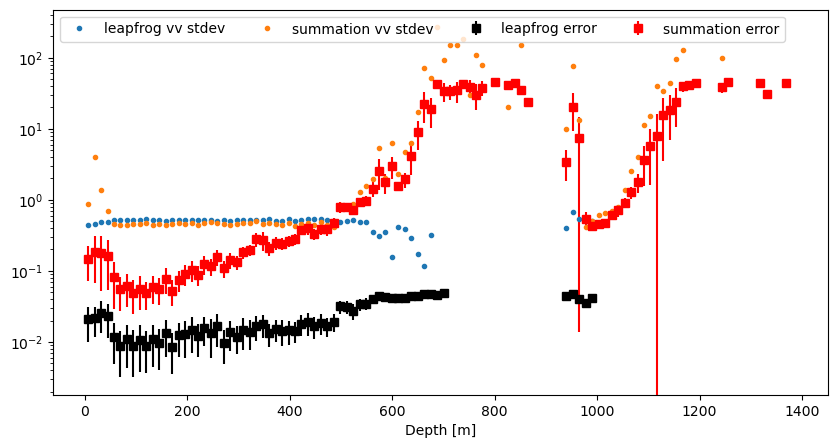

In [29]:
plot_error(vv,vv_err,vv_old,vv_old_err)

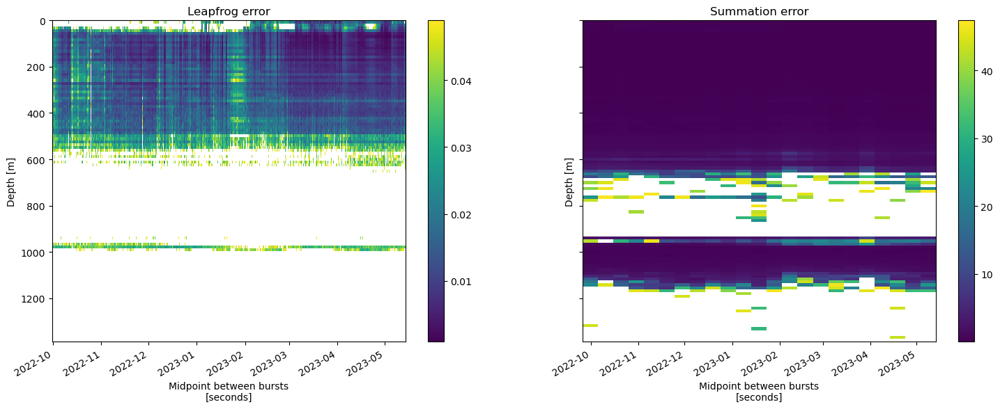

In [30]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Summer 2023

In [31]:
to_plot  = custom_stacked_profile_series(ds_103_s.chirp.isel(attenuator_setting_pair=2),2,3e8,4e8)


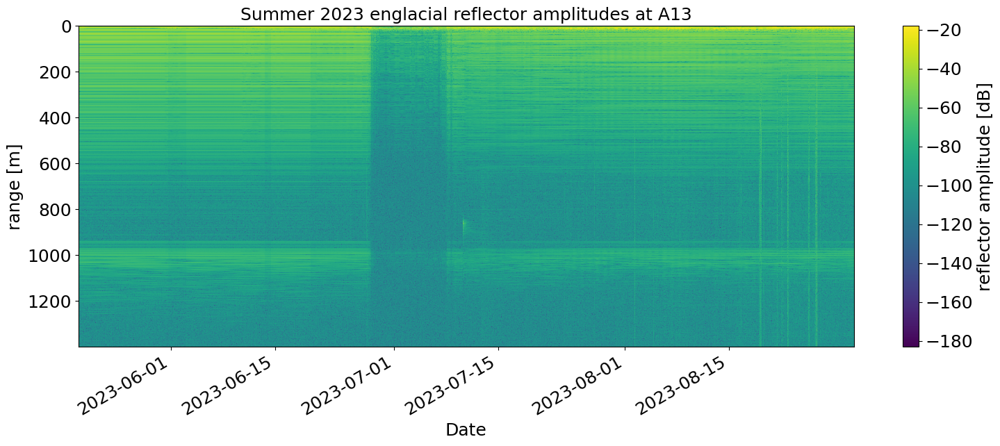

In [32]:
plot_profile(to_plot,'A13','Summer 2023')

/srv/conda/envs/notebook/lib/python3.10/site-packages/matplotlib/axes/_axes.py:1103: RuntimeWarning: All-NaN axis encountered
  minx = np.nanmin(masked_verts[..., 0])
/srv/conda/envs/notebook/lib/python3.10/site-packages/matplotlib/axes/_axes.py:1104: RuntimeWarning: All-NaN axis encountered
  maxx = np.nanmax(masked_verts[..., 0])


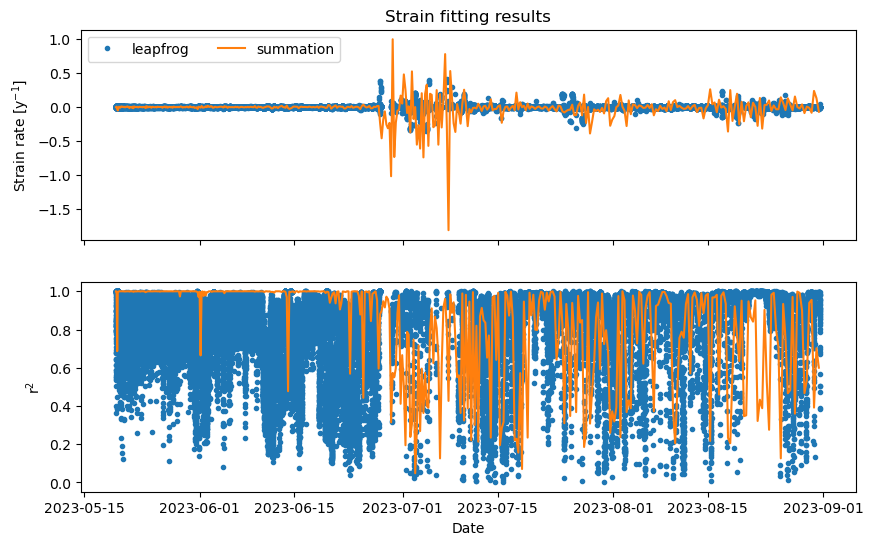

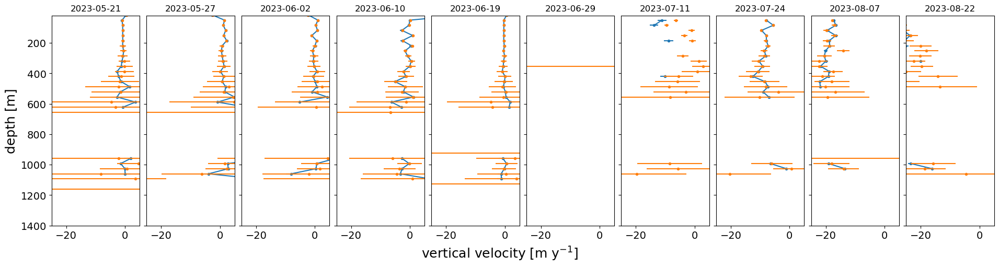

In [33]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,100,[-25,5]) # here the length of window is inaccurate. Might need to interpolate profiles first

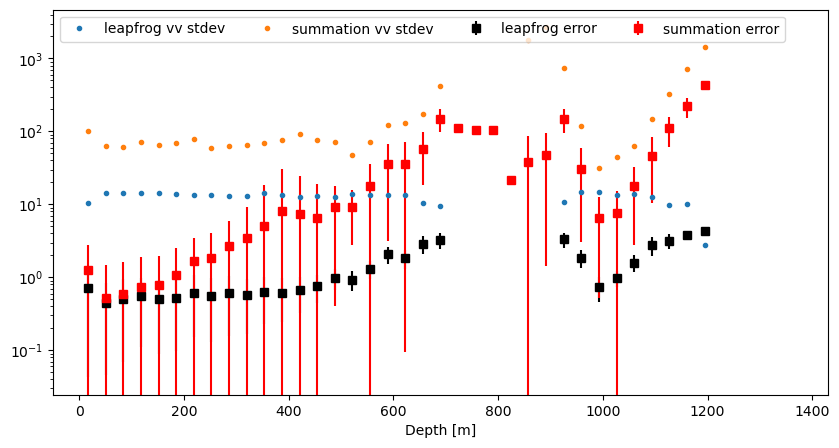

In [34]:
plot_error(vv,vv_err,vv_old,vv_old_err)

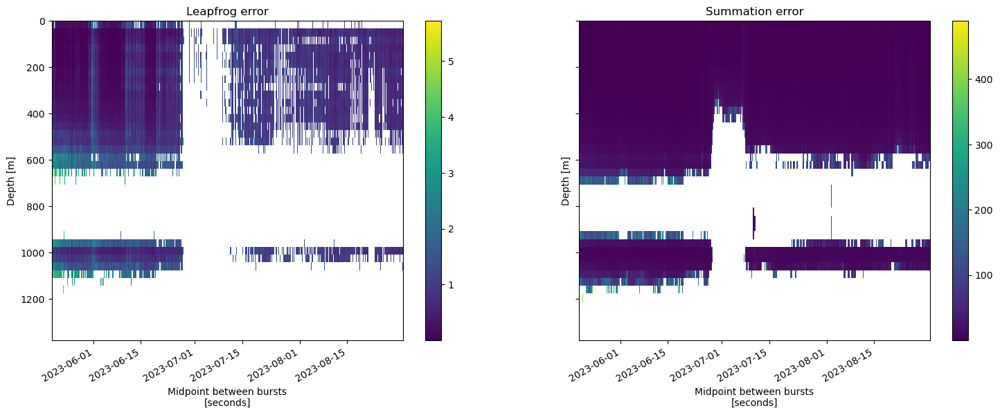

In [35]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


## Station A14

### Summer 2022

In [36]:
to_plot = ds_104.profile_stacked.isel(attenuator_setting_pair=0).compute()


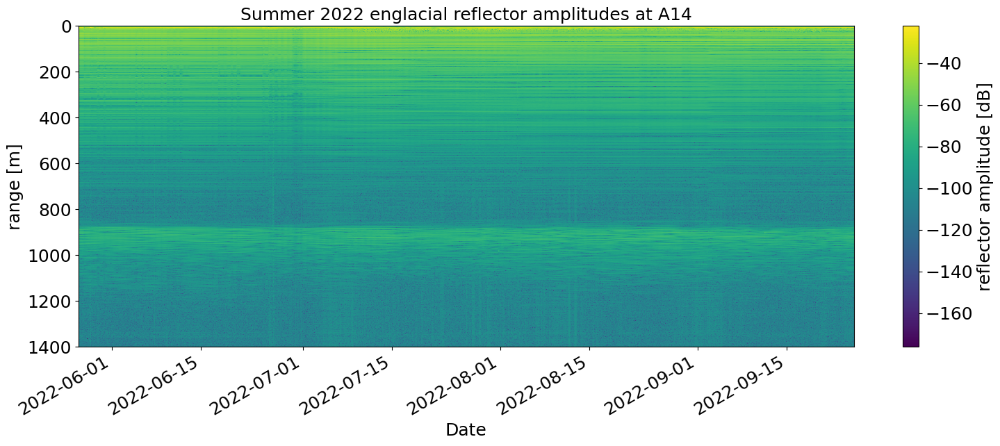

In [37]:
plot_profile(to_plot,'A14','Summer 2022')

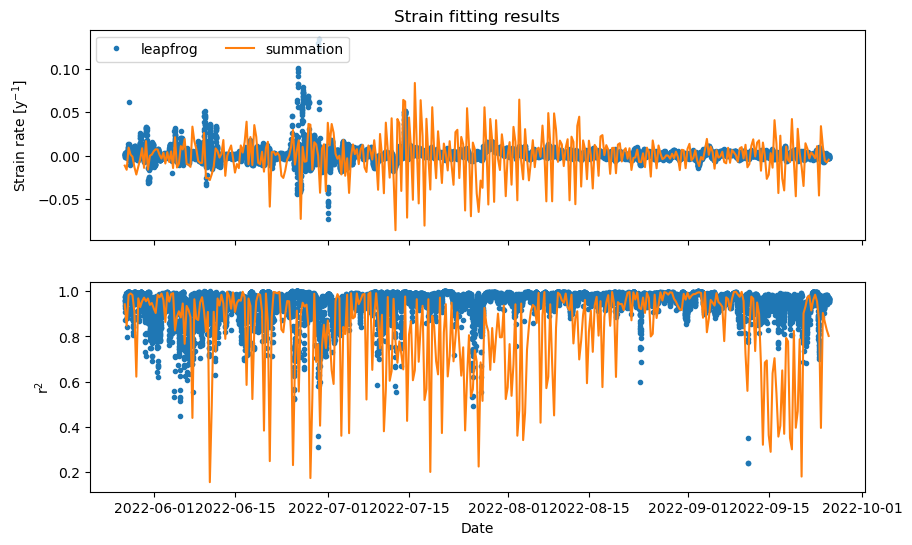

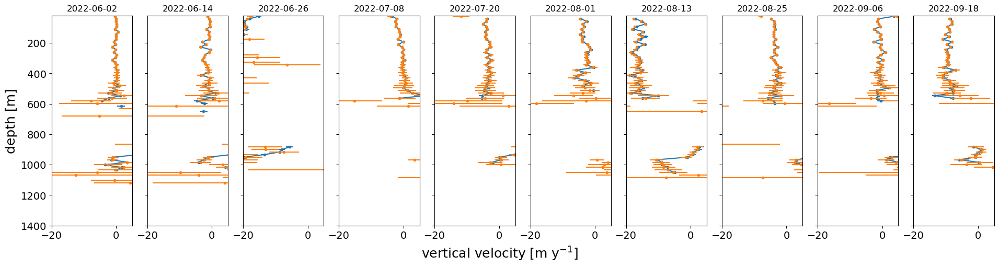

In [38]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,32,[-20,5]) # 8 hour window

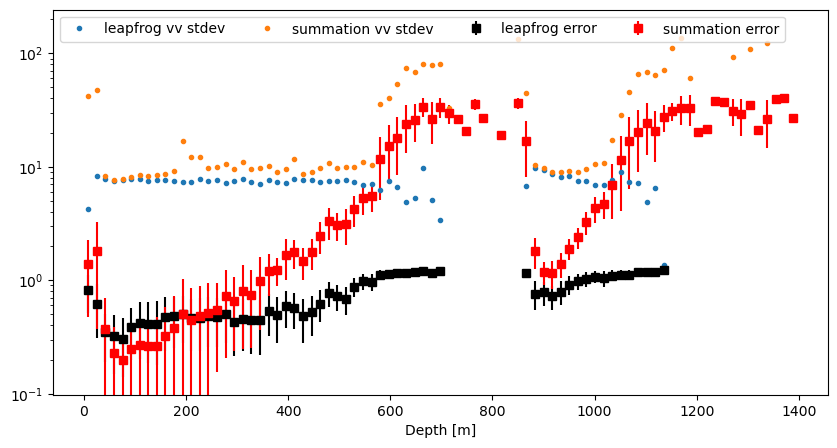

In [39]:
plot_error(vv,vv_err,vv_old,vv_old_err)

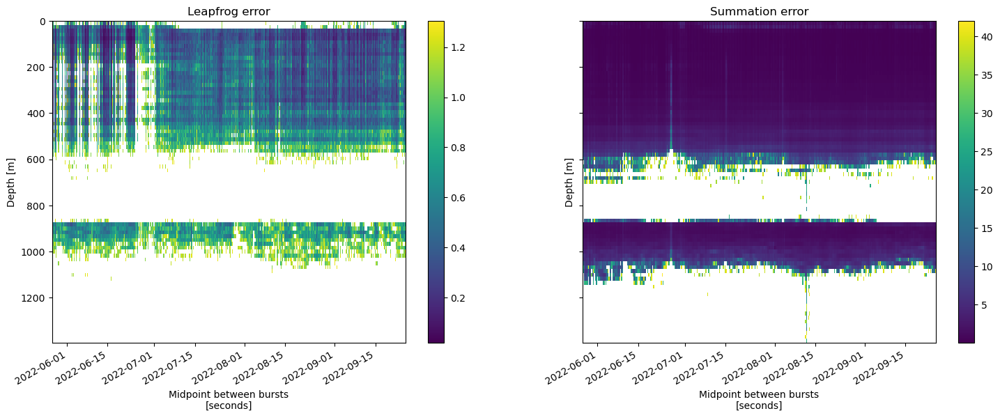

In [40]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Winter 2022-2023

In [41]:
to_plot = ds_104_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


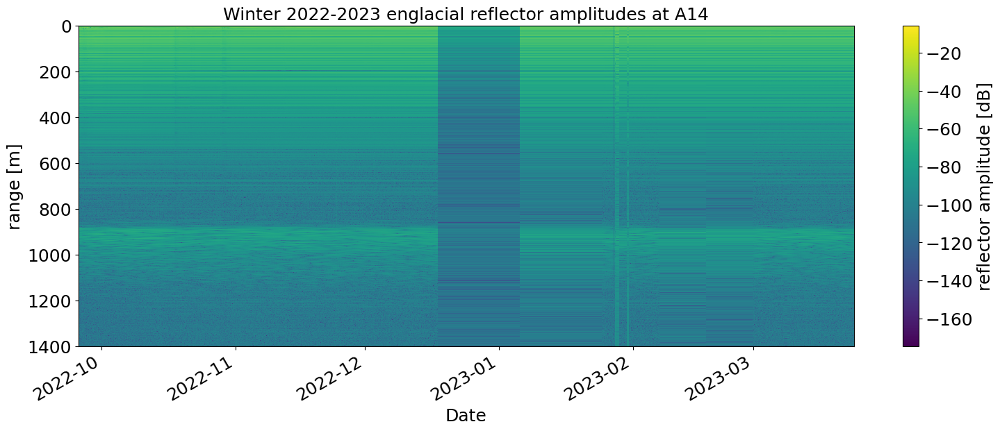

In [42]:
plot_profile(to_plot,'A14','Winter 2022-2023')

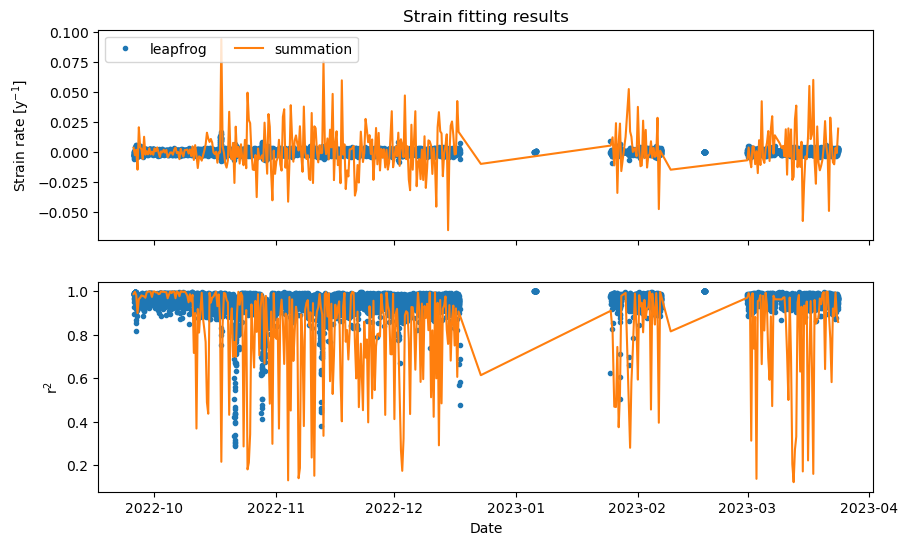

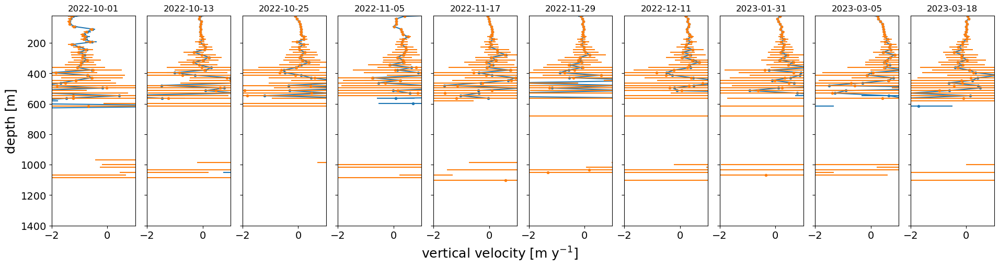

In [43]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,32,[-2,1]) # 8 hour window

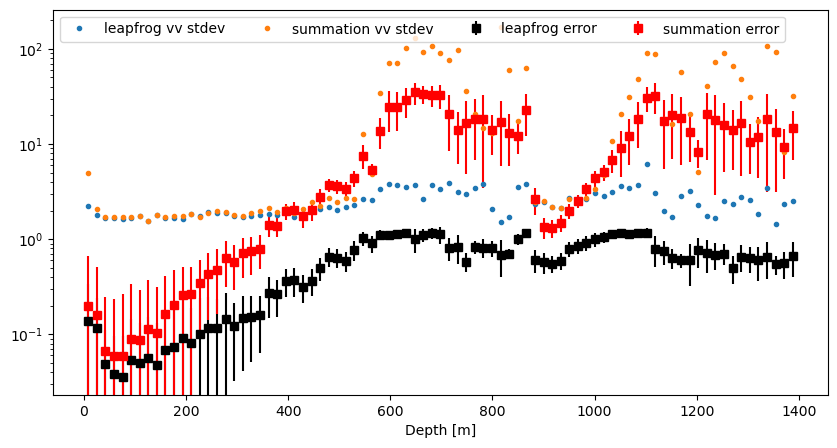

In [44]:
plot_error(vv,vv_err,vv_old,vv_old_err)

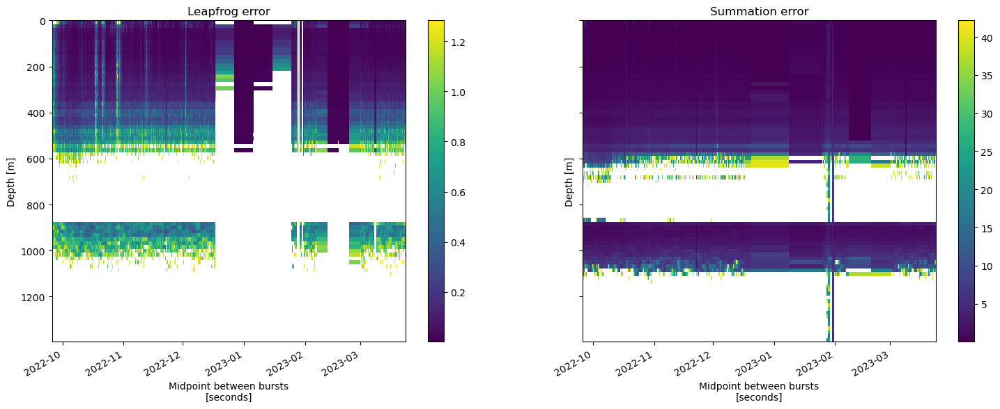

In [45]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


### Summer 2023

In [46]:
to_plot  = custom_stacked_profile_series(ds_104_s.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


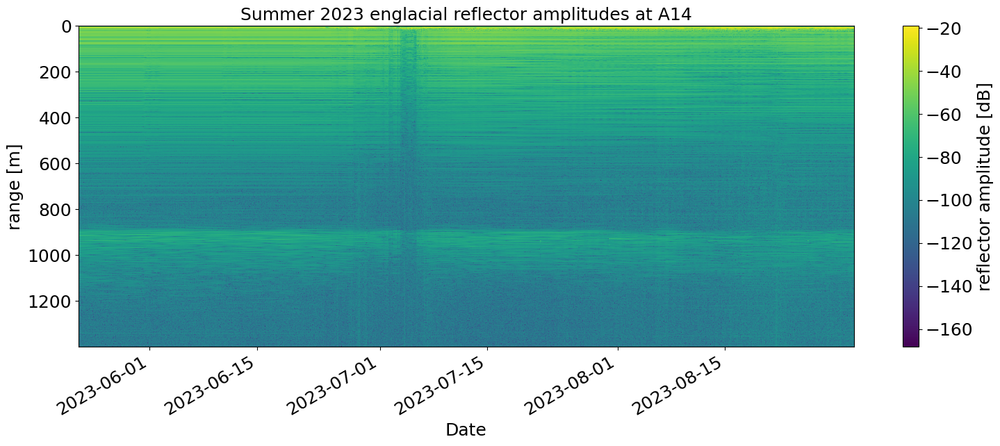

In [47]:
plot_profile(to_plot,'A14','Summer 2023')

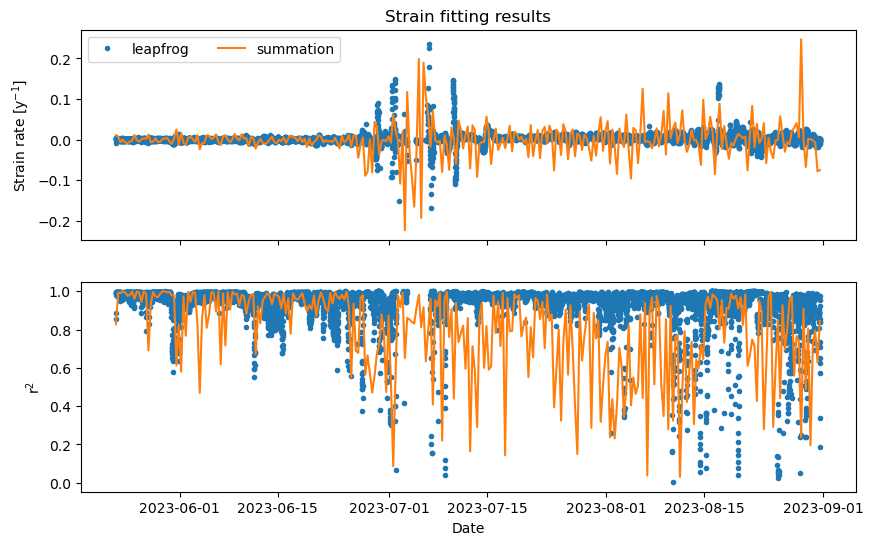

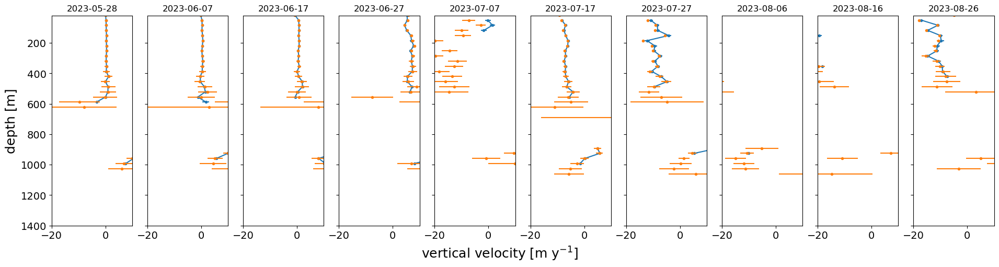

In [51]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit(to_plot,80,32,[-20,10]) # 8 hour window

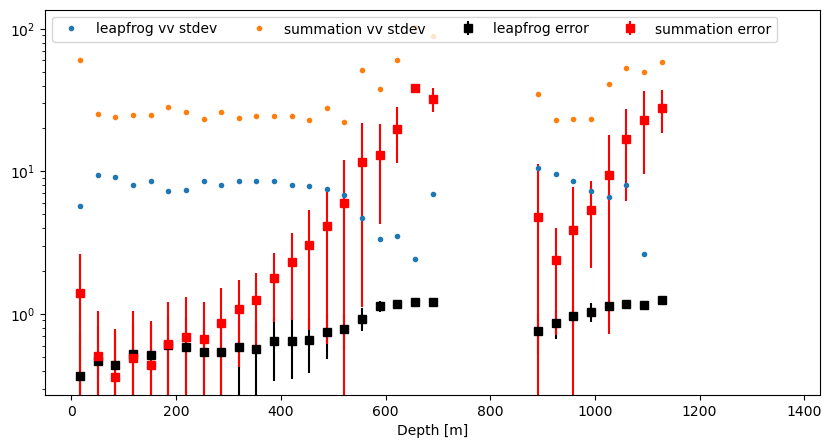

In [49]:
plot_error(vv,vv_err,vv_old,vv_old_err)

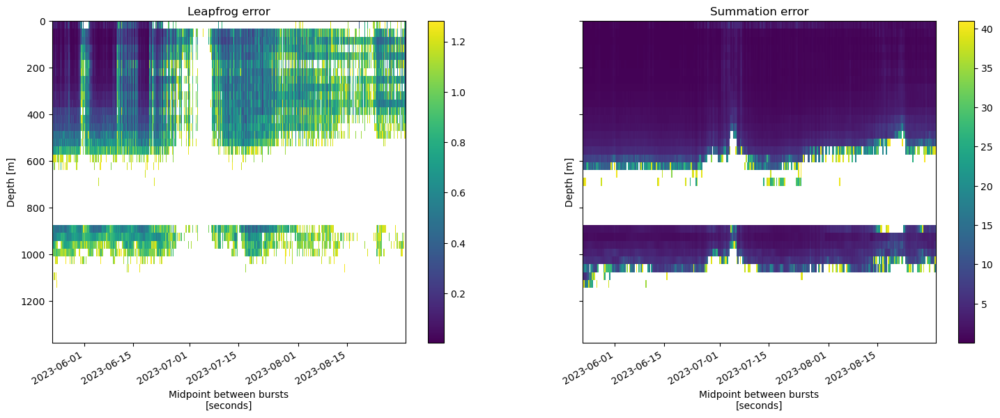

In [50]:
fig,axs = plt.subplots(ncols=2,figsize=(18,6),sharey=True)
vv_err.plot(ax=axs[0],x='time')
axs[0].set_title('Leapfrog error')
vv_old_err.plot(ax=axs[1],x='time')
axs[1].set_title('Summation error')
axs[1].invert_yaxis()


# Lake drainage

In [24]:
def generate_strain_fit_drainage(ds,window,lag,lims=None):
    # New method
    b1= ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_new = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')

    vv = ds_new.range_diff / ds_new.time_diff * 31536000
    vv_err = ds_new.err / ds_new.time_diff * 31536000
    fit=vv.where(vv.profile_range <=600).polyfit('profile_range',1,full=True)
    r2 = 1-fit.polyfit_residuals/((vv-vv.mean())**2).sum(dim='profile_range')
    
    # Old Method
    b1= ds.isel(time=range(0,len(ds)-1))
    b2 = ds.isel(time=range(1,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_old = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')
    vv_old = ds_old.range_diff.coarsen(time=lag,boundary='trim').sum()/ds_old.time_diff.coarsen(time=lag,boundary='trim').sum()*31536000
    vv_old_err = np.sqrt(((ds_old.err)**2).coarsen(time=lag,boundary='trim').sum())/ds_old.time_diff.coarsen(time=lag,boundary='trim').sum()*31536000
    fit_old=vv_old.where(vv_old.profile_range <=600).polyfit('profile_range',1,full=True)
    r2_old = 1-fit_old.polyfit_residuals/((vv_old-vv_old.mean())**2).sum(dim='profile_range')
    
    # Plotting
    fig, axs = plt.subplots(nrows=2,figsize=(10,6),sharex=True)
    axs[0].plot(fit.time.values,fit.polyfit_coefficients.sel(degree=1).values,linestyle='None',marker='.',label='leapfrog')
    axs[0].plot(fit_old.time.values,fit_old.polyfit_coefficients.sel(degree=1).values,label='summation')
    #axs[0].set_ylim([-1e-2,1e-2])
    axs[0].set_ylabel('Strain rate [y$^{-1}$]')
    axs[0].set_title('Strain fitting results')
    axs[0].legend(loc="upper left", ncol=2)
    axs[1].plot(fit.time.values,r2.values,linestyle='None',marker='.')
    axs[1].plot(fit_old.time.values,r2_old.values)
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('r$^2$')
    
    fig1, axs_1 = plt.subplots(ncols=6,figsize=(19,5),sharey=True,layout='constrained')
    #fig1.suptitle('Strain fitting (\u03B5\u0307 in 10$^{-3}$ yr$^{-1}$)',fontsize=18)
    vv_times = np.arange(math.ceil(0.3*len(vv_old.time)),math.ceil(0.9*len(vv_old.time)),math.ceil(0.6*len(vv_old.time))//6)
    for i in range(6):
        time = vv_old.time.isel(time = vv_times[i]).values
        axs_1[i].errorbar(vv.sel(time = time,method="nearest") ,vv.profile_range,yerr=None,xerr=vv_err.sel(time = time,method="nearest"),marker='.',zorder=1)
        axs_1[i].errorbar(vv_old.sel(time = time,method="nearest") ,vv_old.profile_range,yerr=None,xerr=vv_old_err.sel(time = time,method="nearest"),linestyle='',marker='.',zorder=2)
        #slope = fit.polyfit_coefficients.sel(degree=1).isel(time=vv_times[i]).values*np.linspace(20,600)+fit.polyfit_coefficients.sel(degree=0).isel(time=vv_times[i]).values

        #axs_1[i].plot(slope,np.linspace(20,600),color='r',zorder=2)
        unit = ''#'x10$^{-3}$ yr$^{-1}$'
        #axs_1[plt_count].text(-10,300, f"\u03B5\u0307= {fit.polyfit_coefficients.sel(degree=1).isel(time=i).values*1000:.2g}"+unit,color = 'r',fontsize=14)
        axs_1[i].set_title(f'{time.astype(str)[:16]}'.replace('T',' '))
        if lims:
            axs_1[i].set_xlim(lims)
        axs_1[i].set_ylim([20,1400])
        axs_1[i].tick_params(axis='both', which='major', labelsize=14)


    axs_1[0].invert_yaxis()

    axs_1[0].set_ylabel('depth [m]',fontsize=18)
    fig1.supxlabel('vertical velocity [m y$^{-1}$]',fontsize=18)
    return vv,vv_err,vv_old,vv_old_err

## A11

In [9]:
to_plot  = custom_stacked_profile_series(ds_101.chirp.isel(attenuator_setting_pair=1,time=range(4400,4900)),2,3e8,4e8)


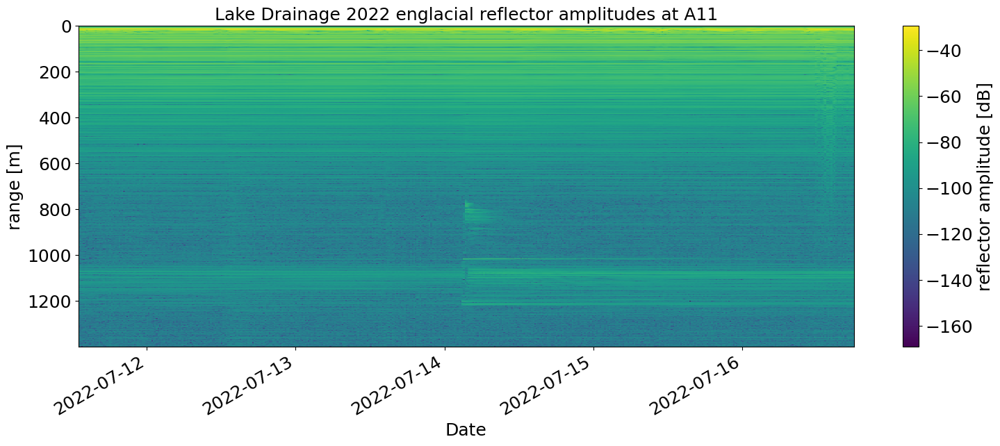

In [10]:
plot_profile(to_plot,'A11','Lake Drainage 2022')

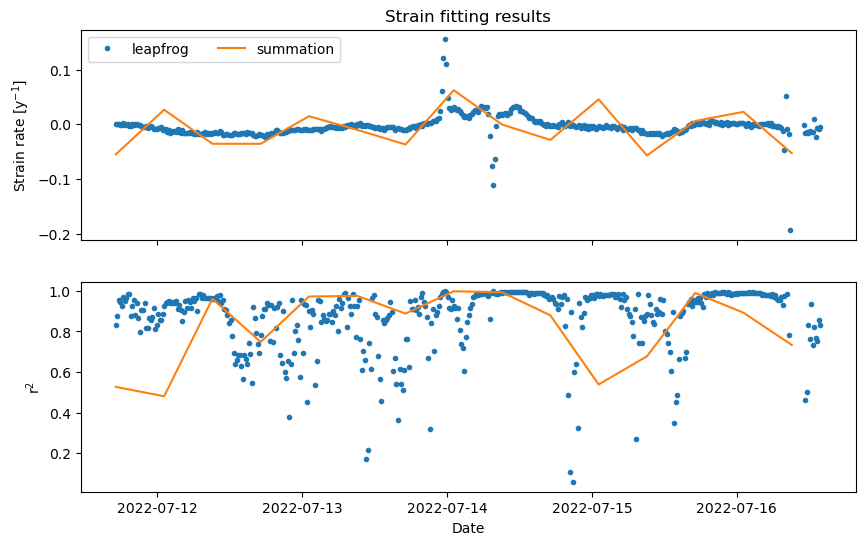

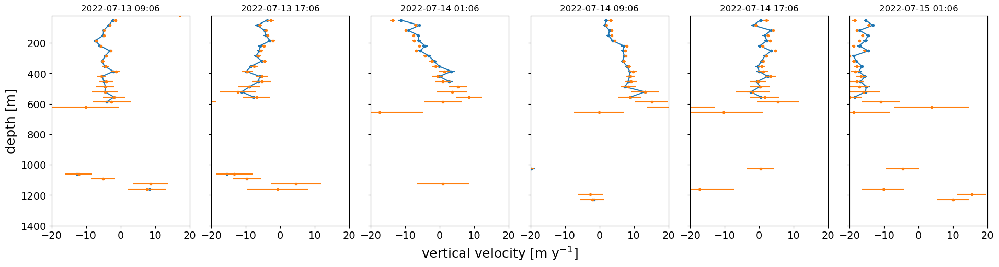

In [28]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit_drainage(to_plot,80,32,[-20,20]) # ~8 hour window
#plot_error(vv,vv_err,vv_old,vv_old_err)

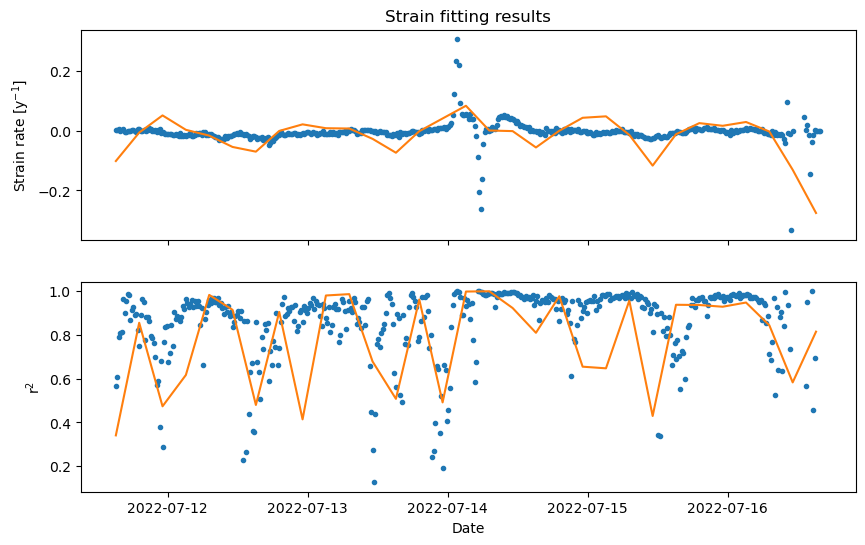

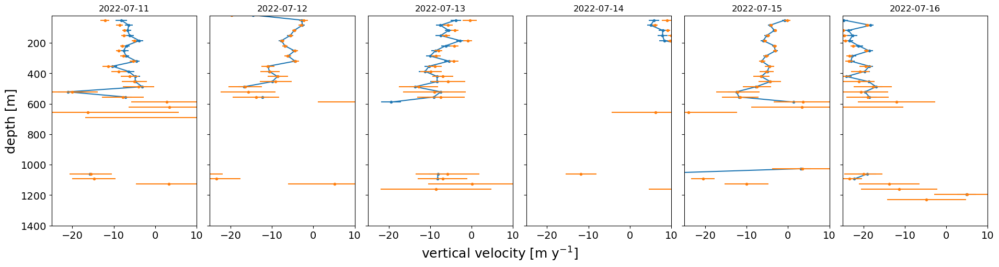

In [98]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit_drainage(to_plot,80,16,[-25,10]) # ~4 hour window

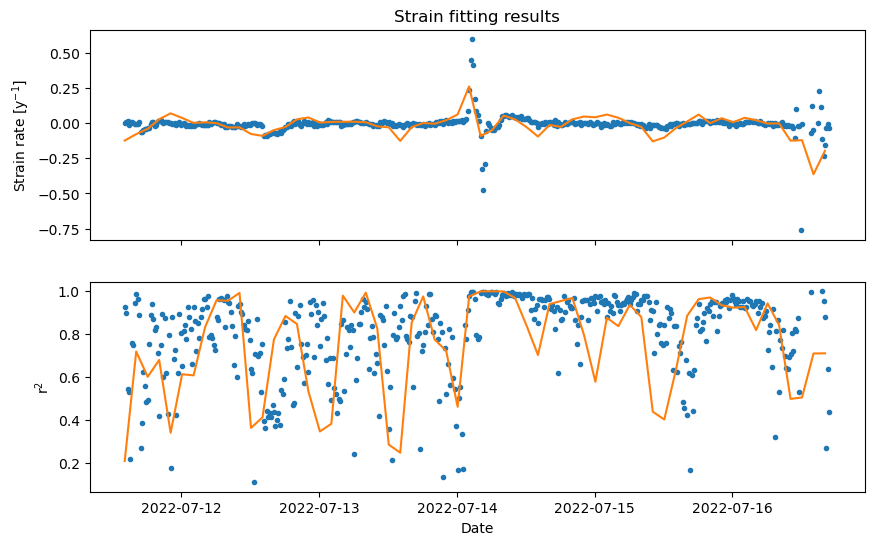

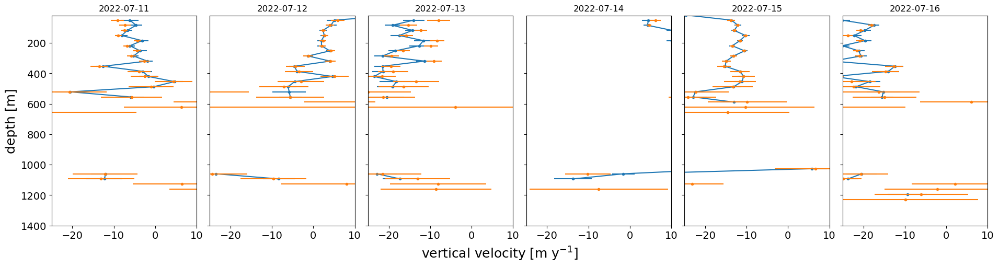

In [36]:
generate_strain_fit_drainage(to_plot,80,8,[-25,10]) # ~2 hour window

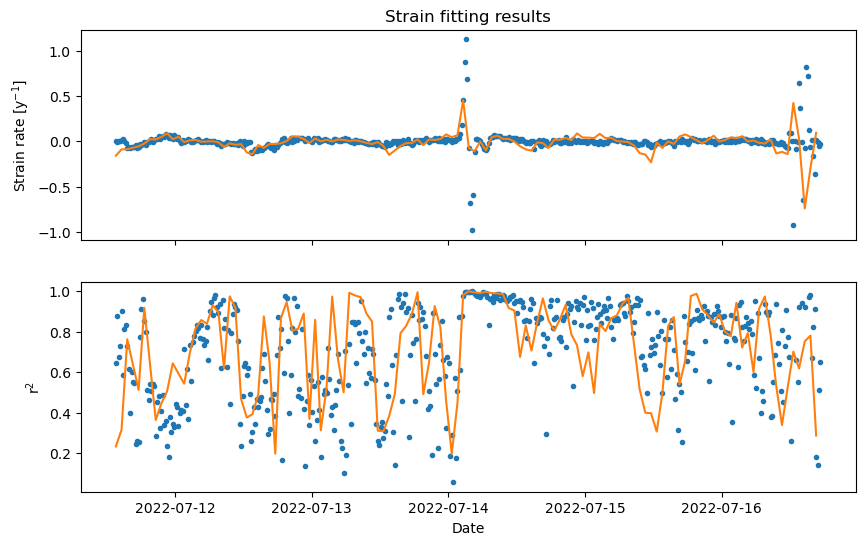

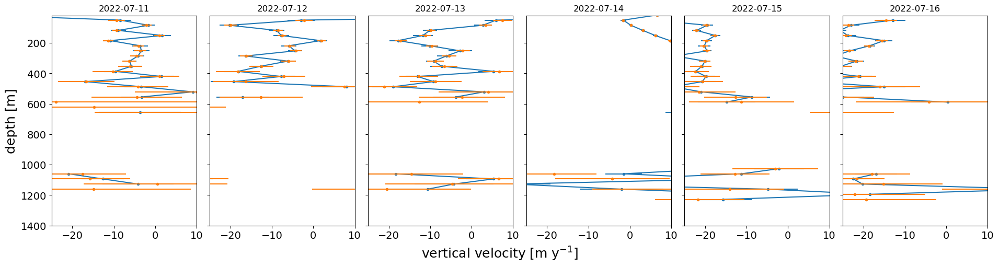

In [37]:
generate_strain_fit_drainage(to_plot,80,4,[-25,10]) # ~1 hour window

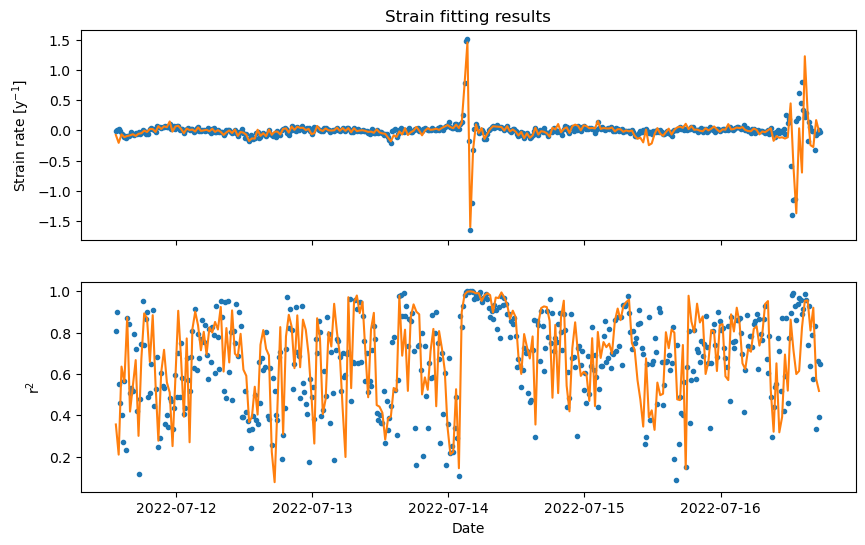

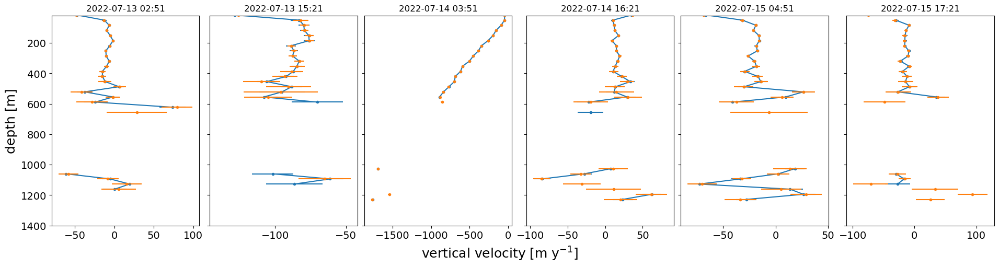

In [23]:
vv,vv_err,vv_old,vv_old_err = generate_strain_fit_drainage(to_plot,80,2) # ~30 minute window

## A13

In [39]:
to_plot  = custom_stacked_profile_series(ds_103.chirp.isel(attenuator_setting_pair=1,time=range(4400,4900)),2,3e8,4e8)


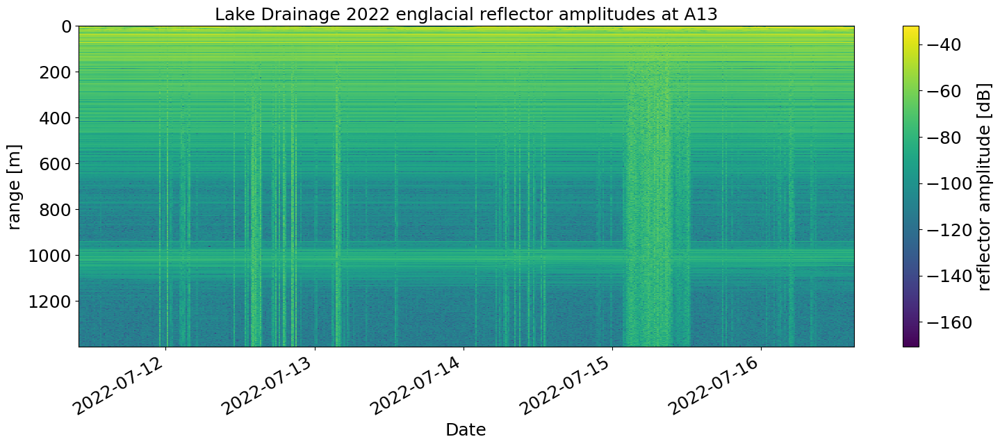

In [40]:
plot_profile(to_plot,'A13','Lake Drainage 2022')

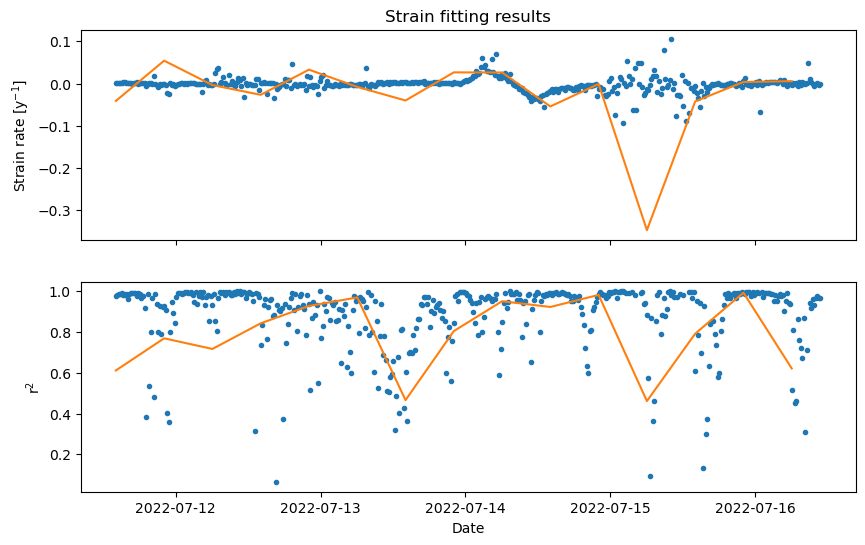

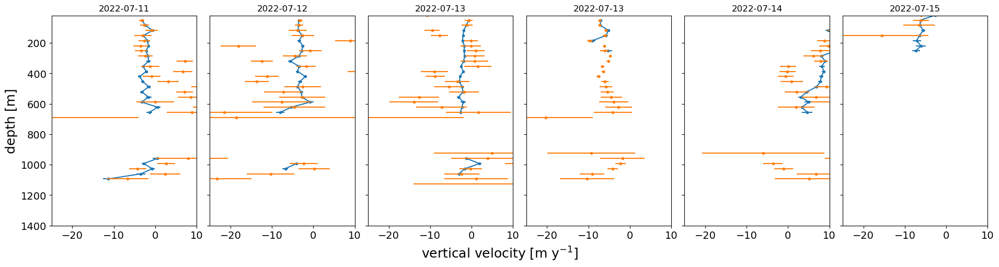

In [41]:
generate_strain_fit_drainage(to_plot,80,32,[-25,10]) # ~8 hour window

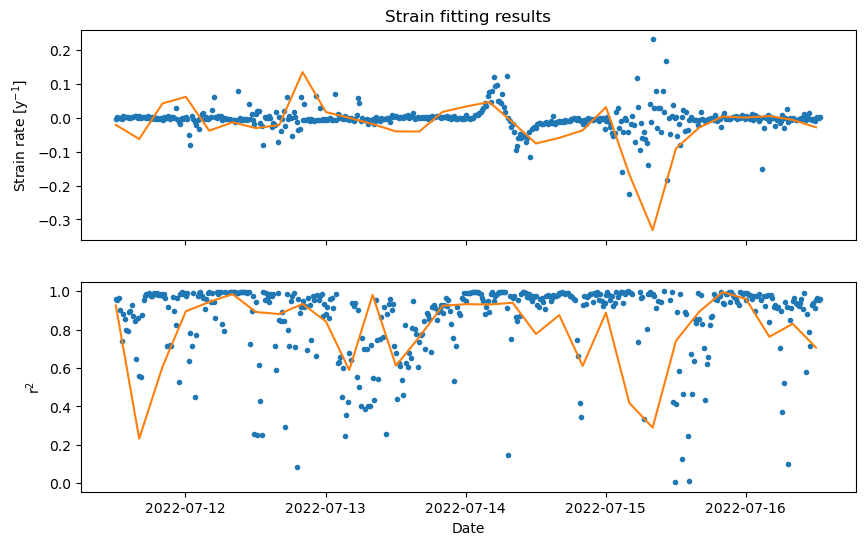

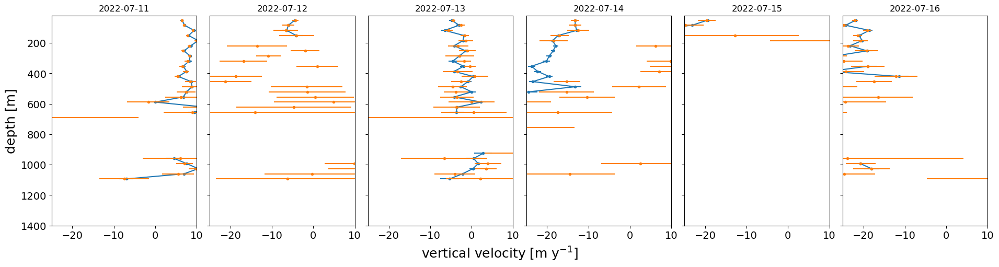

In [42]:
generate_strain_fit_drainage(to_plot,80,16,[-25,10]) # ~4 hour window

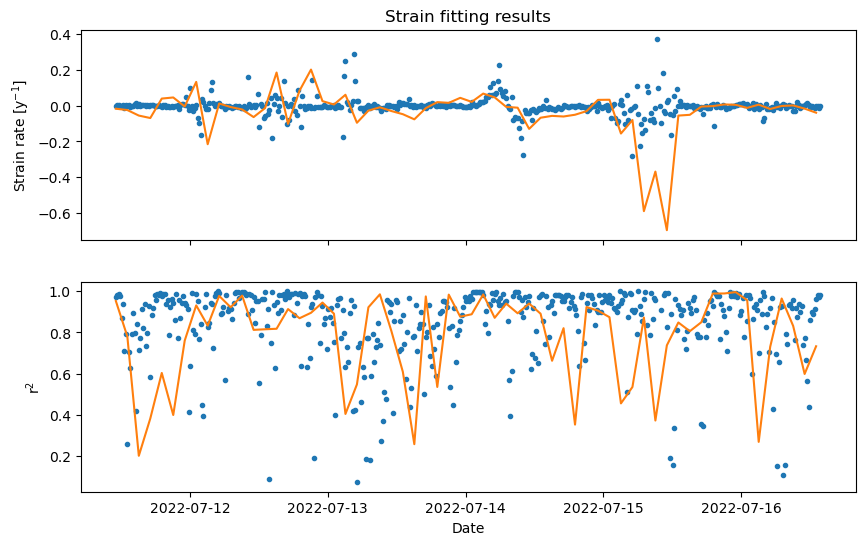

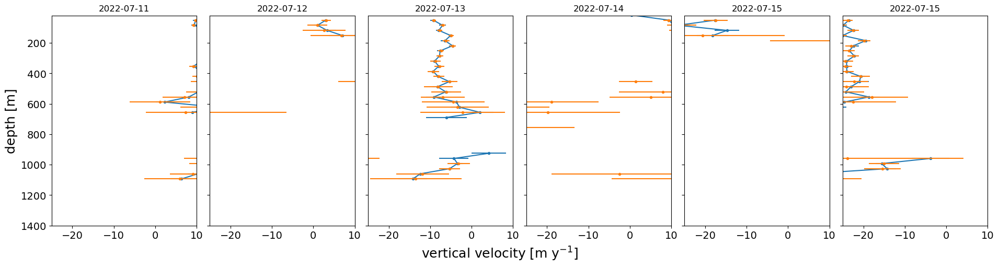

In [43]:
generate_strain_fit_drainage(to_plot,80,8,[-25,10]) # ~2 hour window

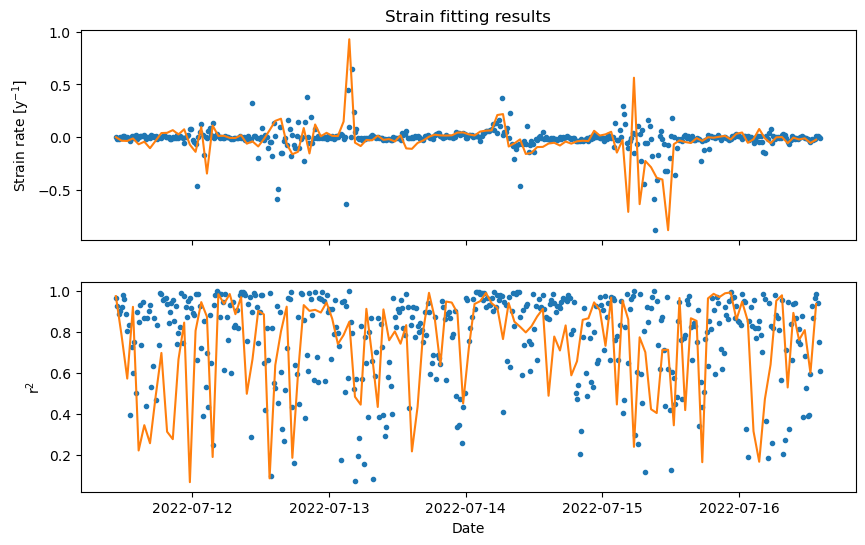

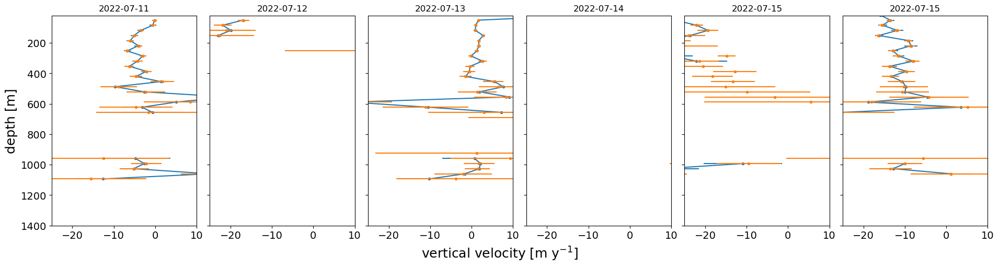

In [44]:
generate_strain_fit_drainage(to_plot,80,4,[-25,10]) # ~1 hour window

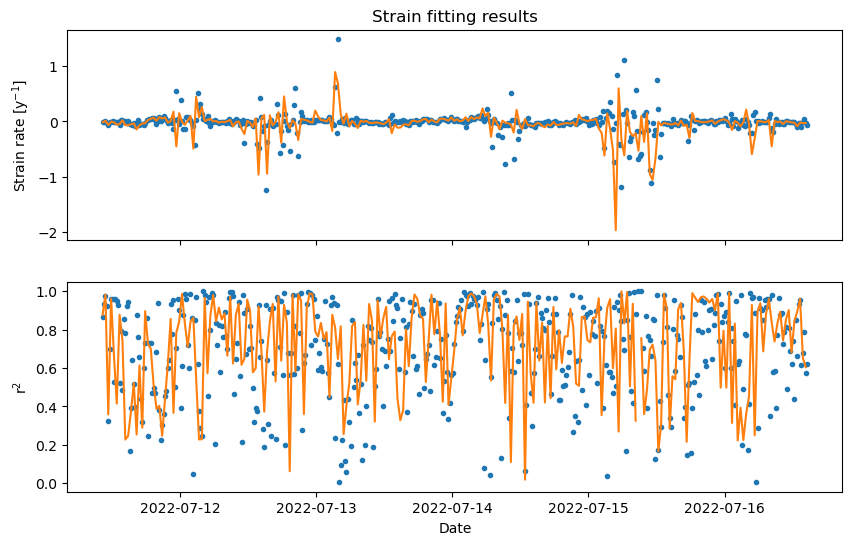

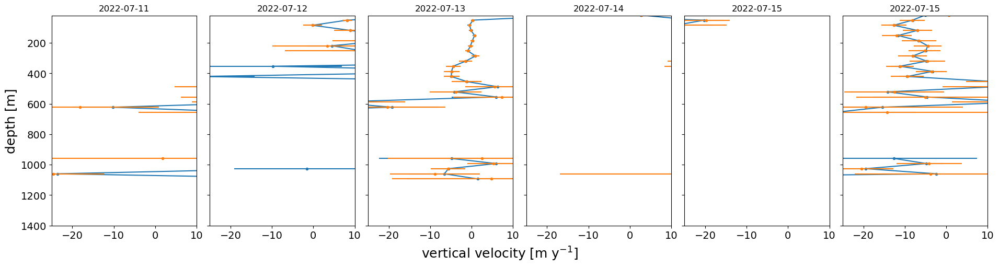

In [45]:
generate_strain_fit_drainage(to_plot,80,2,[-25,10]) # ~30 minute window

## A14

In [47]:
to_plot  = custom_stacked_profile_series(ds_104.chirp.isel(attenuator_setting_pair=0,time=range(4400,4900)),2,3e8,4e8)


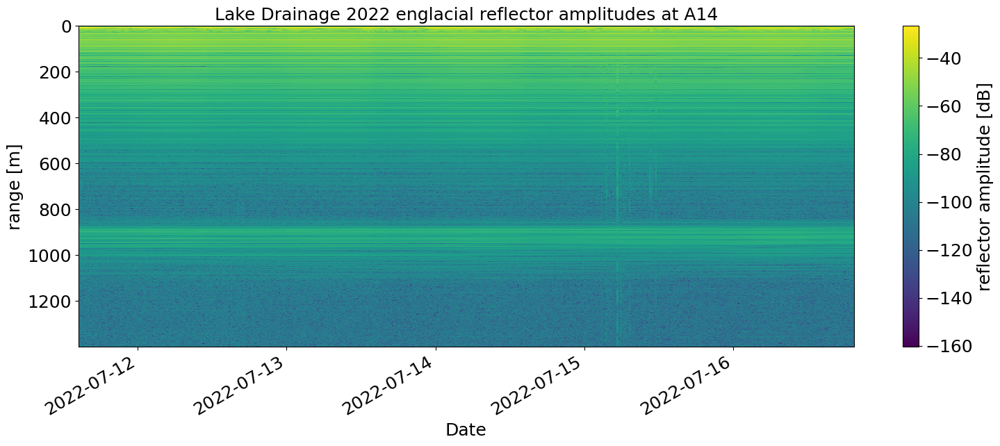

In [50]:
plot_profile(to_plot,'A14','Lake Drainage 2022')

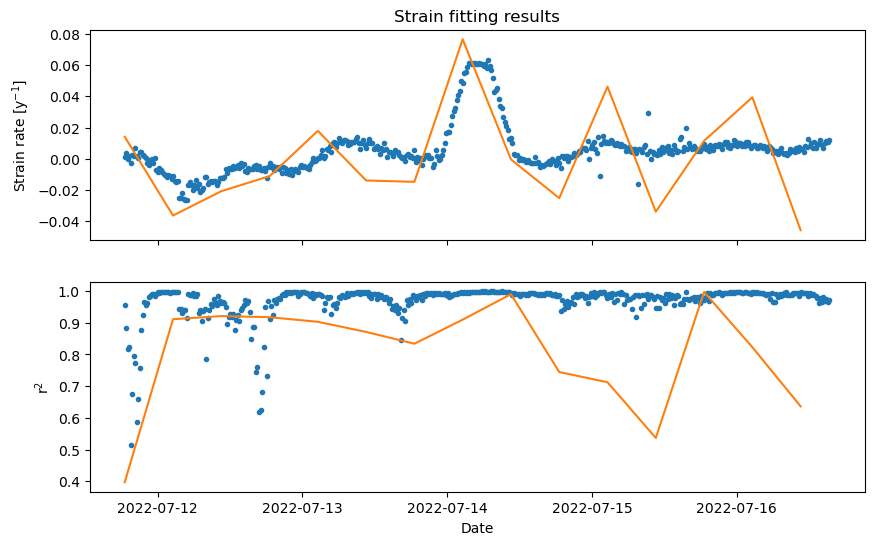

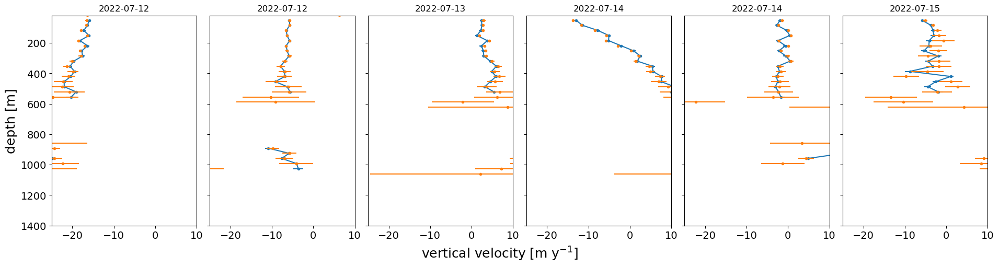

In [51]:
generate_strain_fit_drainage(to_plot,80,32,[-25,10]) # ~8 hour window

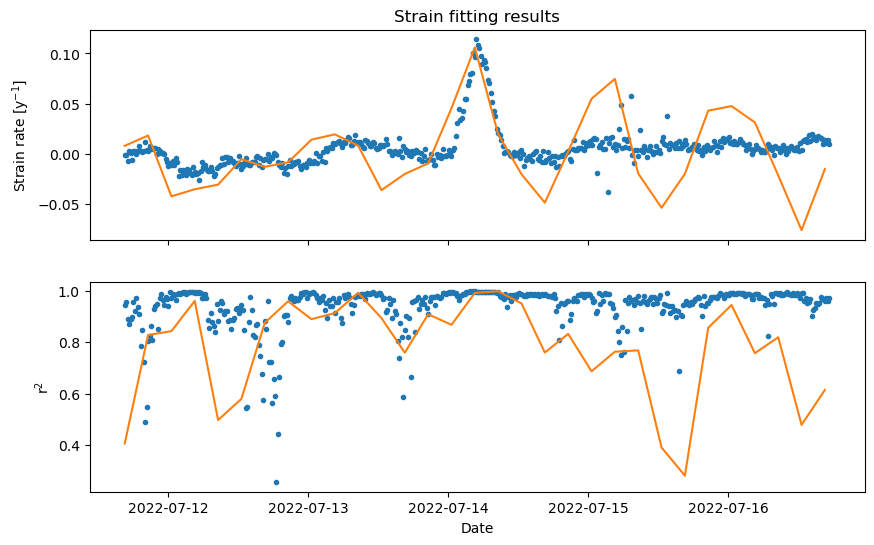

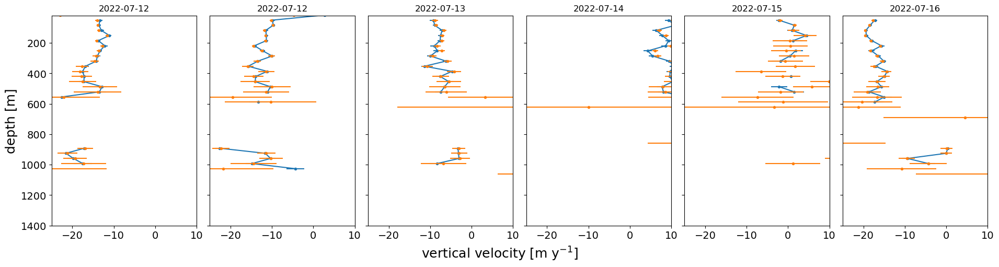

In [52]:
generate_strain_fit_drainage(to_plot,80,16,[-25,10]) # ~4 hour window

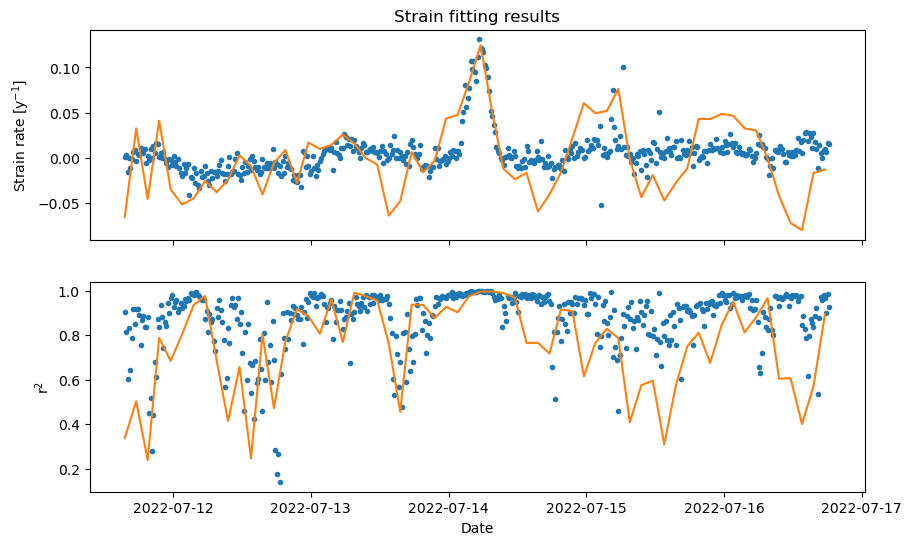

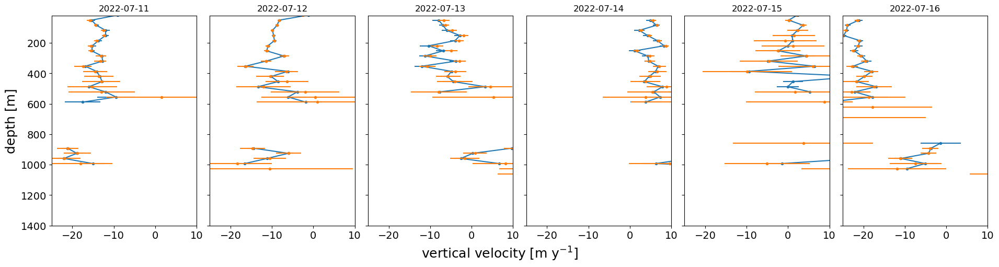

In [53]:
generate_strain_fit_drainage(to_plot,80,8,[-25,10]) # ~2 hour window

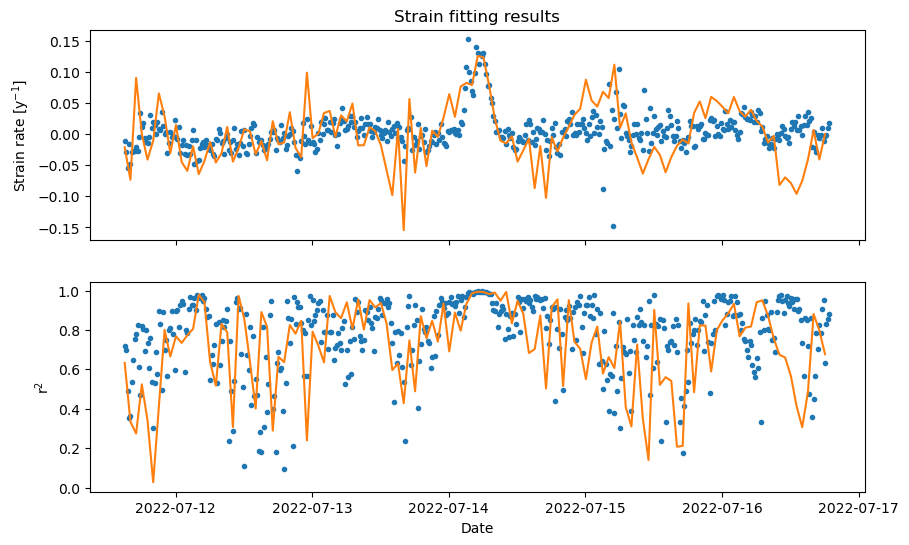

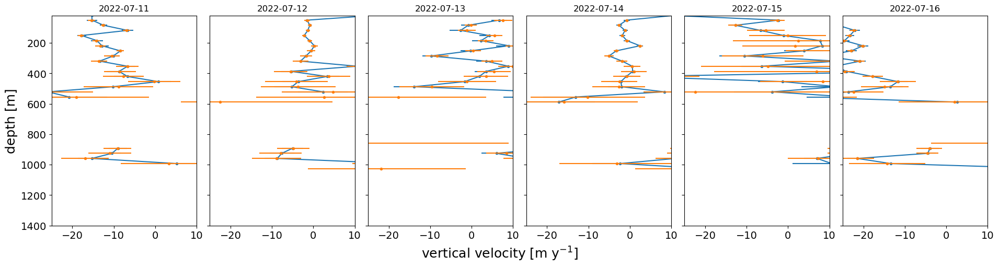

In [54]:
generate_strain_fit_drainage(to_plot,80,4,[-25,10]) # ~1 hour window

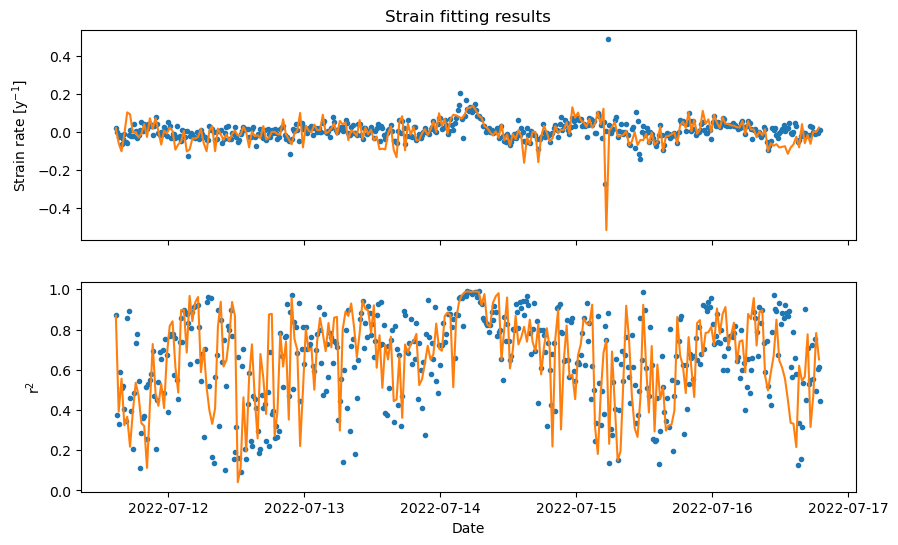

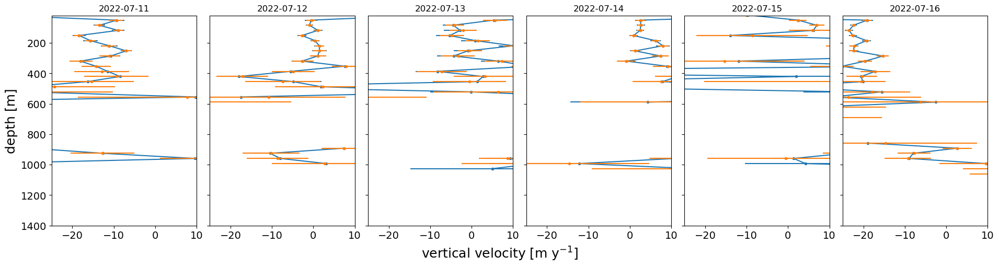

In [55]:
generate_strain_fit_drainage(to_plot,80,2,[-25,10]) # ~30 minute window